# Imports

In [1]:
import numpy as np
import pandas as pd
import seaborn as sns
import random
import os
from datetime import datetime
import matplotlib.pyplot as plt
%matplotlib inline
from sklearn.metrics import classification_report, confusion_matrix
from sklearn.metrics import accuracy_score, precision_recall_fscore_support
from tensorflow import keras
import tensorflow as tf
import tensorflow_hub as hub
from tensorflow import keras
from tensorflow.keras.utils import plot_model
from tensorflow.keras.layers import (Input, Conv2D, AveragePooling2D, Flatten, Dense, Concatenate,
                                     Rescaling, MaxPooling2D, BatchNormalization, Dropout, Add,
                                     Multiply, GlobalAveragePooling2D, Activation, DepthwiseConv2D)
from tensorflow.keras.models import Model
from tensorflow.keras.layers import RandomFlip, RandomRotation, RandomZoom
from tensorflow.keras.models import Model
from datetime import datetime as dt
from tensorflow.keras.callbacks import TensorBoard

# Helper Functions

In [2]:
! wget https://raw.githubusercontent.com/DriveMyScream/Python_libraries/main/helper_functions.py

--2023-09-14 19:19:07--  https://raw.githubusercontent.com/DriveMyScream/Python_libraries/main/helper_functions.py
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.110.133, 185.199.108.133, 185.199.109.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.110.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 7752 (7.6K) [text/plain]
Saving to: ‘helper_functions.py’

helper_functions.py 100%[===================>]   7.57K  --.-KB/s    in 0s      

2023-09-14 19:19:07 (73.6 MB/s) - ‘helper_functions.py’ saved [7752/7752]



In [3]:
from helper_functions import (make_confusion_matrix, plot_loss_curves, calculate_results, plot_class_accuracy,
                              plot_prediction_confidence_histogram, plot_random_misclassified_images, create_tensorboard_callback)

# Data Downloading

In [4]:
! pip install -q kaggle
! mkdir ~/.kaggle
! cp kaggle.json ~/.kaggle/
! chmod 600 /root/.kaggle/kaggle.json
! kaggle datasets download -d gpiosenka/beauty-detection-data-set
! unzip "/content/beauty-detection-data-set.zip" -d "/content/dataset"

 99% 138M/140M [00:02<00:00, 93.8MB/s]
100% 140M/140M [00:02<00:00, 61.6MB/s]
Archive:  /content/beauty-detection-data-set.zip
  inflating: /content/dataset/EfficientNetB1-beauty-100.0.h5  
  inflating: /content/dataset/beauty.csv  
  inflating: /content/dataset/class_dict.csv  
  inflating: /content/dataset/images to predict/1.jpg  
  inflating: /content/dataset/images to predict/2.jpg  
  inflating: /content/dataset/images to predict/3.jpg  
  inflating: /content/dataset/images to predict/4.jpg  
  inflating: /content/dataset/images to predict/5.jpg  
  inflating: /content/dataset/test/average/001.jpg  
  inflating: /content/dataset/test/average/002.jpg  
  inflating: /content/dataset/test/average/003.jpg  
  inflating: /content/dataset/test/average/004.jpg  
  inflating: /content/dataset/test/average/005.jpg  
  inflating: /content/dataset/test/average/006.jpg  
  inflating: /content/dataset/test/average/007.jpg  
  inflating: /content/dataset/test/average/008.jpg  
  inflating: /co

# Data Loading

In [5]:
train_data_directory = "/content/dataset/train"
test_data_directory = "/content/dataset/test"
val_data_directory = "/content/dataset/valid"

In [6]:
from tensorflow.keras.preprocessing import image_dataset_from_directory

In [7]:
train_dataset = image_dataset_from_directory(train_data_directory,
                                            labels = 'inferred',
                                            label_mode = 'binary',
                                            color_mode = 'rgb',
                                            batch_size = 64,
                                            image_size = (128, 128),
                                            shuffle = True,
                                            seed = 99)

Found 4000 files belonging to 2 classes.


In [8]:
test_dataset = image_dataset_from_directory(test_data_directory,
                                            labels = 'inferred',
                                            label_mode = 'binary',
                                            color_mode = 'rgb',
                                            batch_size = 64,
                                            image_size = (128, 128),
                                            shuffle = True,
                                            seed = 99)

Found 300 files belonging to 2 classes.


In [9]:
val_dataset = image_dataset_from_directory(val_data_directory,
                                            labels = 'inferred',
                                            label_mode = 'binary',
                                            color_mode = 'rgb',
                                            batch_size = 64,
                                            image_size = (128, 128),
                                            shuffle = True,
                                            seed = 99)

Found 300 files belonging to 2 classes.


# Class Weights

In [10]:
class_names = train_dataset.class_names
num_classes = len(class_names)
print("Total Number of Classes: ", num_classes)
print("Class Names:", class_names)

Total Number of Classes:  2
Class Names: ['average', 'beautiful']


In [11]:
subdirectories = [subdir for subdir in os.listdir(train_data_directory) if os.path.isdir(os.path.join(train_data_directory, subdir))]
subdirectories.sort()

image_counts = {}
for index, subdir in enumerate(subdirectories, start=0):
  subdirectory_path = os.path.join(train_data_directory, subdir)
  image_files = [filename for filename in os.listdir(subdirectory_path) if os.path.isfile(os.path.join(subdirectory_path, filename))]
  image_count = len(image_files)
  image_counts[index] = image_count

print("Image Count", image_counts)

Image Count {0: 2000, 1: 2000}


<BarContainer object of 2 artists>

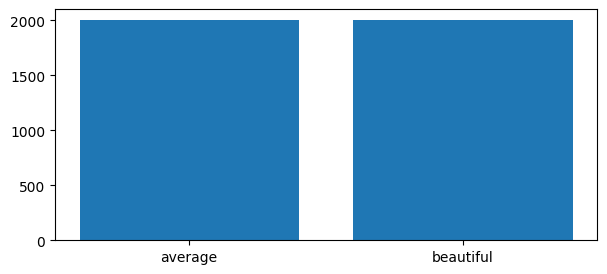

In [12]:
plt.figure(figsize=(7, 3))
image_names = subdirectories
image_count = list(image_counts.values())

plt.bar(range(len(image_count)), image_count, tick_label=image_names)

In [13]:
total_images_count = 4000
class_weights = {}
for index, count in image_counts.items():
  class_weights[index] = total_images_count / count

print("Class Weights:", class_weights)

Class Weights: {0: 2.0, 1: 2.0}


# Data Augumentation

In [14]:
data_augmentation = keras.Sequential([
    RandomFlip("horizontal_and_vertical"),
    RandomRotation(0.2),
    RandomZoom(0.2)
])

In [15]:
augmented_train_dataset = train_dataset.map(lambda x, y: (data_augmentation(x, training=True), y))

# Visulizations

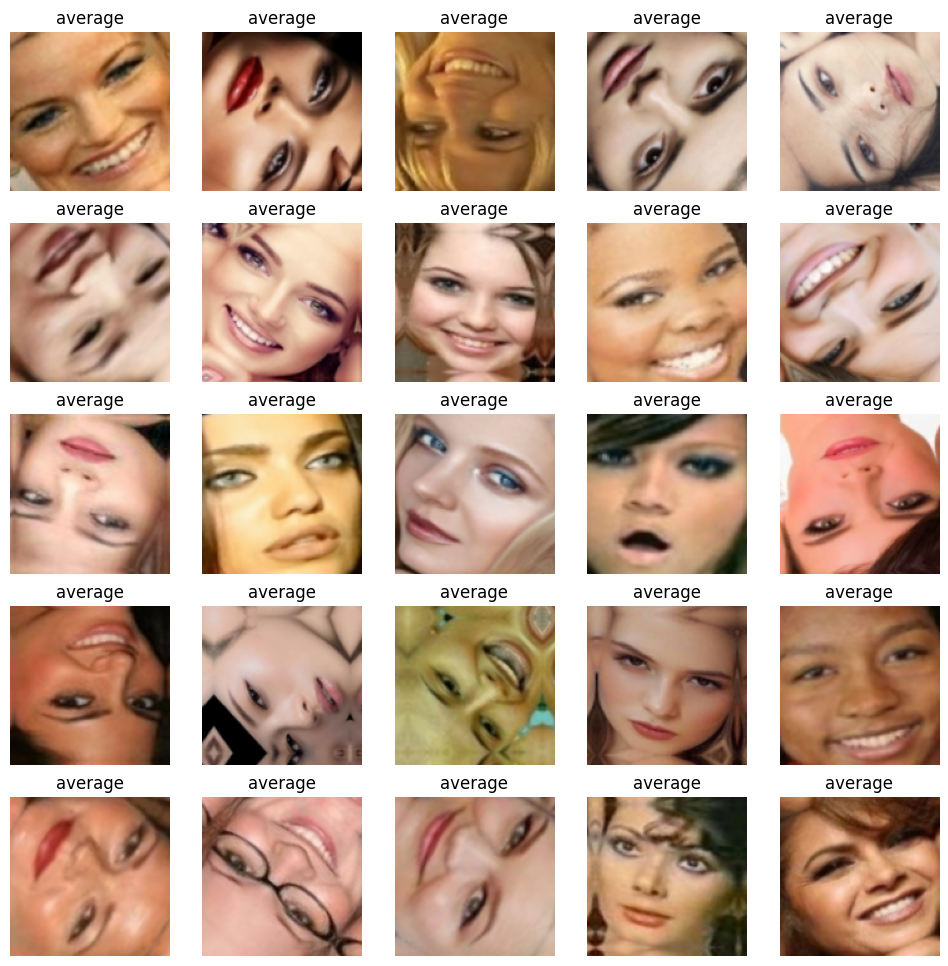

In [16]:
plt.figure(figsize=(12, 12))
for images, labels in augmented_train_dataset.take(1):
    for i in range(25):
        plt.subplot(5, 5, i+1)
        plt.imshow(images[i]/255)
        plt.title(class_names[tf.argmax(labels[i], axis=0)])
        plt.axis("off");

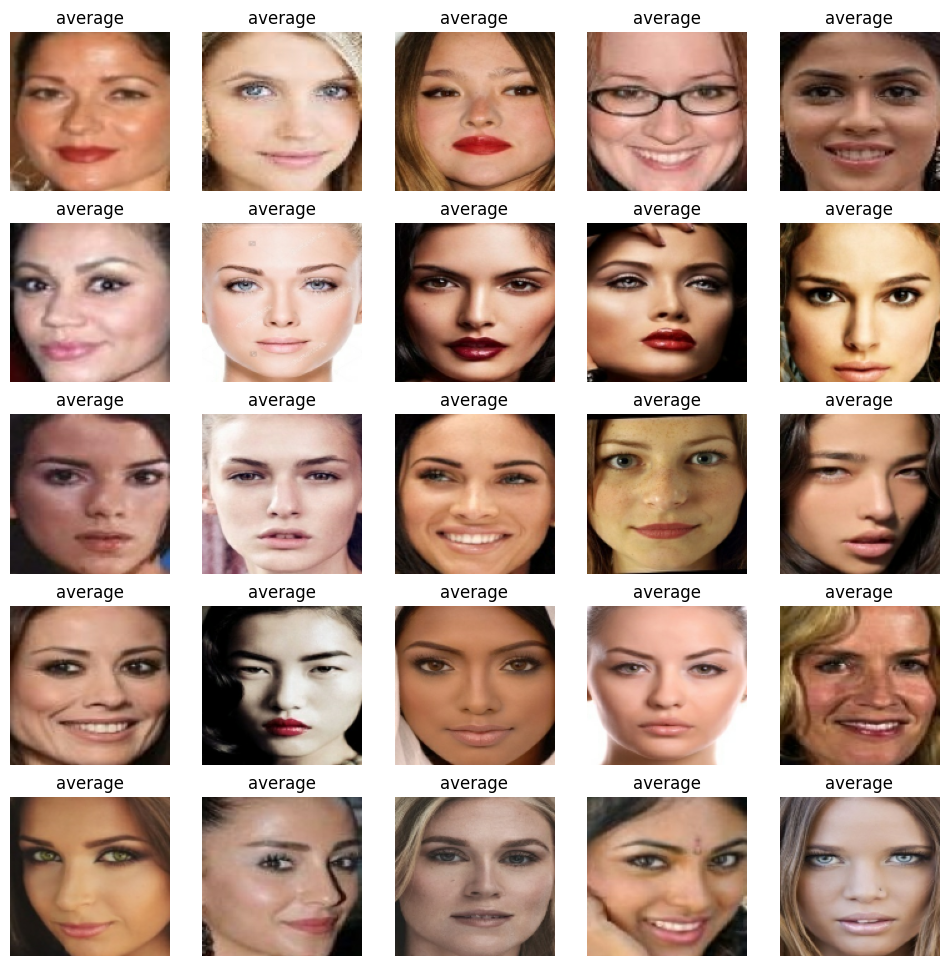

In [17]:
plt.figure(figsize=(12, 12))

for images, labels in train_dataset.take(1):
  for i in range(25):
    plt.subplot(5, 5, i+1)
    plt.imshow(images[i]/255)
    plt.title(class_names[tf.argmax(labels[i], axis=0)])
    plt.axis("off")

# Data Loading

In [19]:
train_dataset = (train_dataset
                 .shuffle(buffer_size=100)
                 .prefetch(tf.data.AUTOTUNE))

In [20]:
test_dataset = (test_dataset
                .shuffle(buffer_size=100)
                .prefetch(tf.data.AUTOTUNE))

In [21]:
val_dataset = (val_dataset
               .shuffle(buffer_size=100)
               .prefetch(tf.data.AUTOTUNE))

# Tensorboard Callback

In [22]:
# Directory for tensorboard callback
os.mkdir("logs")

In [23]:
def create_tensorboard_callback(model_name):
    log_dir = os.path.join("logs", model_name + "_" + dt.now().strftime("%Y%m%d-%H%M%S"))
    tensorboard_callback = TensorBoard(log_dir=log_dir)
    return tensorboard_callback

# Lenet Model

In [24]:
input_layer = Input(shape=(128, 128, 3))
rescale = Rescaling(scale=1./255)(input_layer)
conv1 = Conv2D(filters=6, kernel_size=(5, 5), activation='relu', padding='same')(rescale)
pool1 = AveragePooling2D(pool_size=(2, 2), strides=(2, 2))(conv1)
conv2 = Conv2D(filters=16, kernel_size=(5, 5), activation='relu')(pool1)
pool2 = AveragePooling2D(pool_size=(2, 2), strides=(2, 2))(conv2)
flatten = Flatten()(pool2)
dense1 = Dense(units=120, activation='relu')(flatten)
dense2 = Dense(units=84, activation='relu')(dense1)

output_layer = Dense(units=1, activation='sigmoid')(dense2)

lenet_model = Model(inputs=input_layer, outputs=output_layer)
lenet_model.summary()

Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 128, 128, 3)]     0         
                                                                 
 rescaling (Rescaling)       (None, 128, 128, 3)       0         
                                                                 
 conv2d (Conv2D)             (None, 128, 128, 6)       456       
                                                                 
 average_pooling2d (Average  (None, 64, 64, 6)         0         
 Pooling2D)                                                      
                                                                 
 conv2d_1 (Conv2D)           (None, 60, 60, 16)        2416      
                                                                 
 average_pooling2d_1 (Avera  (None, 30, 30, 16)        0         
 gePooling2D)                                                

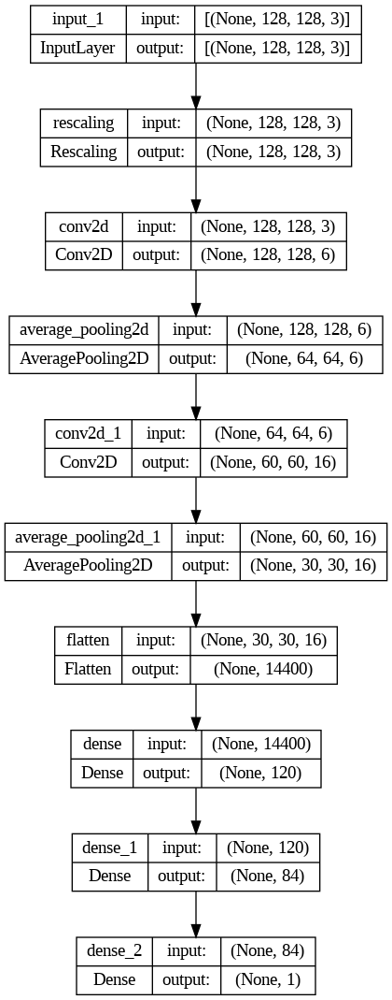

In [25]:
plot_model(lenet_model, show_shapes=True)

In [26]:
lenet_model.compile(optimizer='adam',
                    loss='binary_crossentropy',
                    metrics=['accuracy'])

In [27]:
lenet_model_history = lenet_model.fit(train_dataset,
                                      validation_data=test_dataset,
                                      callbacks = create_tensorboard_callback("lenet_model"),
                                      class_weight = class_weights,
                                      epochs=5)

Epoch 1/5
63/63 [==============================] - 17s 23ms/step - loss: 1.2646 - accuracy: 0.6385 - val_loss: 0.5431 - val_accuracy: 0.7300
Epoch 2/5
63/63 [==============================] - 4s 22ms/step - loss: 1.0019 - accuracy: 0.7592 - val_loss: 0.4339 - val_accuracy: 0.8067
Epoch 3/5
63/63 [==============================] - 3s 19ms/step - loss: 0.8746 - accuracy: 0.8048 - val_loss: 0.3765 - val_accuracy: 0.8367
Epoch 4/5
63/63 [==============================] - 3s 19ms/step - loss: 0.7491 - accuracy: 0.8372 - val_loss: 0.3894 - val_accuracy: 0.8200
Epoch 5/5
63/63 [==============================] - 3s 21ms/step - loss: 0.6811 - accuracy: 0.8543 - val_loss: 0.3255 - val_accuracy: 0.8667


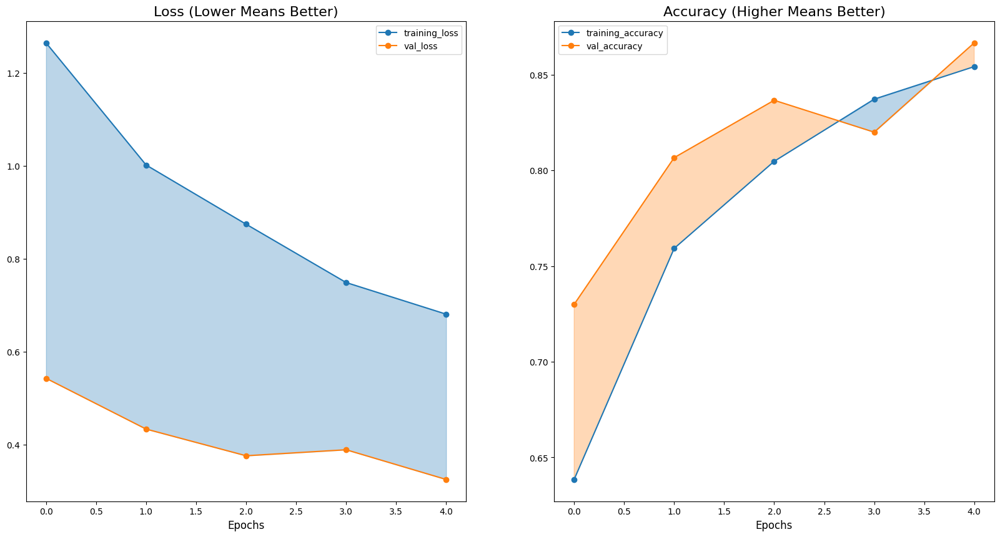

In [28]:
plot_loss_curves(lenet_model_history)

# Error Analysis of lenet model

In [29]:
true_labels = []
predicted_labels = []
images = []

for batch_images, batch_labels in val_dataset:
    batch_predictions = lenet_model.predict(batch_images)
    batch_predicted_labels = np.round(batch_predictions)
    images.extend(batch_images)
    true_labels.extend(batch_labels)
    predicted_labels.extend(batch_predicted_labels)

true_labels = np.array(true_labels)
predicted_labels = np.array(predicted_labels)

2/2 [==============================] - 0s 6ms/step


In [30]:
lenet_model_results = calculate_results(y_true = true_labels,
                                        y_pred = predicted_labels)
lenet_model_results

{'accuracy': 81.66666666666667,
 'precision': 0.8170189098998888,
 'recall': 0.8166666666666667,
 'f1': 0.8166157265907197}

Confusion Matrix:


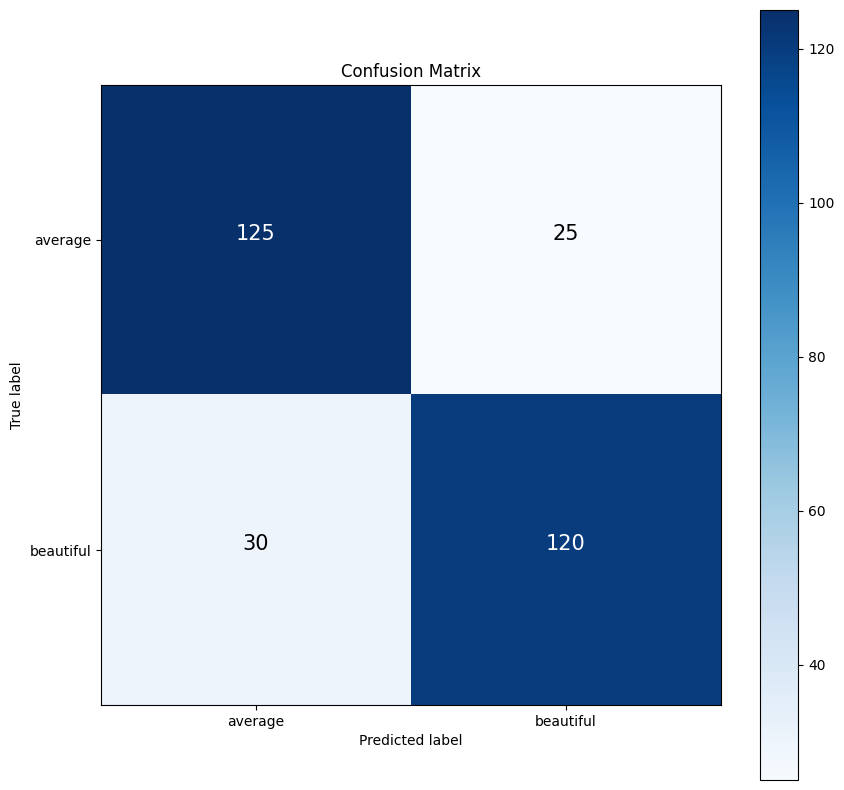

In [31]:
print("Confusion Matrix:")
make_confusion_matrix(y_true = true_labels,
                      y_pred = predicted_labels,
                      classes = class_names)

In [32]:
print("Classification Report:")
print(classification_report(true_labels, predicted_labels))

Classification Report:
              precision    recall  f1-score   support

         0.0       0.81      0.83      0.82       150
         1.0       0.83      0.80      0.81       150

    accuracy                           0.82       300
   macro avg       0.82      0.82      0.82       300
weighted avg       0.82      0.82      0.82       300



ClassWise accuracy


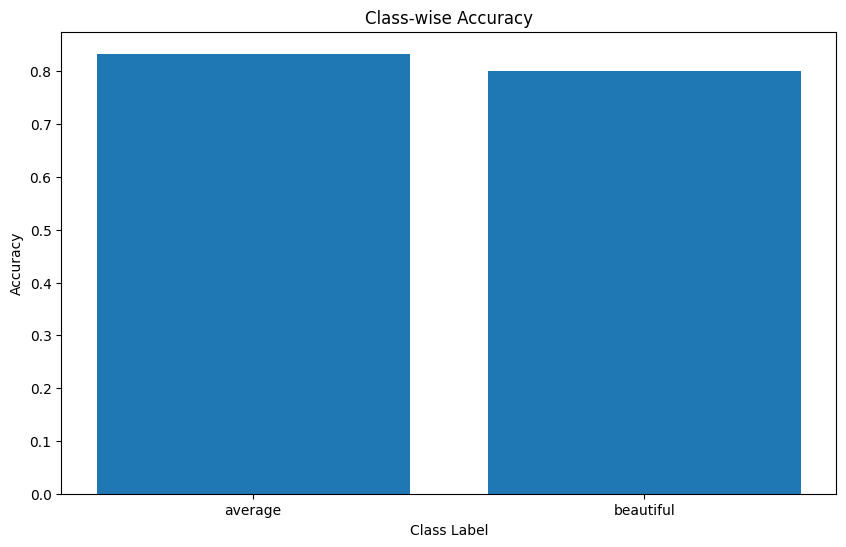

In [33]:
print("ClassWise accuracy")
plot_class_accuracy(num_classes = num_classes,
                    y_true = true_labels,
                    y_pred = predicted_labels,
                    classes = class_names)

Plot Misclassified images:


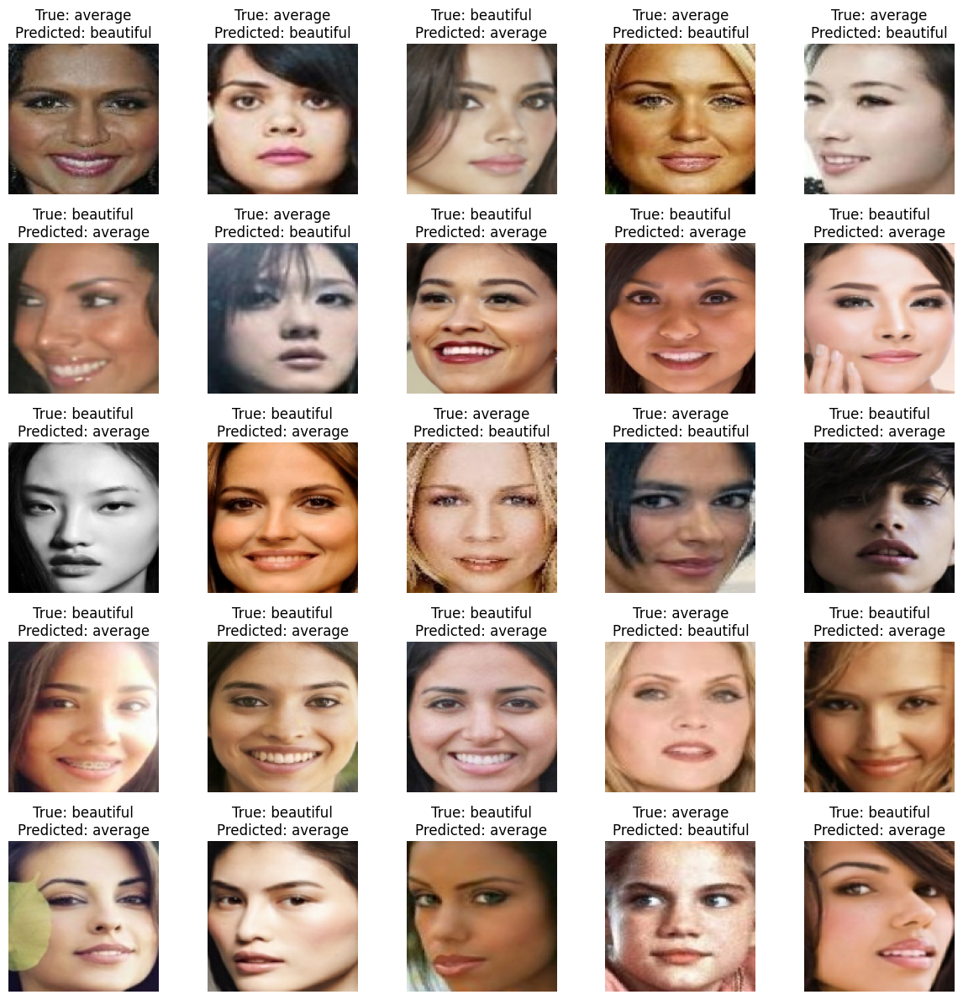

In [34]:
print("Plot Misclassified images:")
plot_random_misclassified_images(y_true = true_labels,
                                 y_pred = predicted_labels,
                                 images = images,
                                 classes = class_names)

# Alexnet Model

In [35]:
input_layer = Input(shape=(128, 128, 3))

rescale = Rescaling(scale=1./255)(input_layer)
x = Conv2D(filters=96, kernel_size=(11, 11), strides=(4, 4), activation='relu', padding='valid')(rescale)
x = MaxPooling2D(pool_size=(3, 3), strides=(2, 2))(x)
x = Conv2D(filters=256, kernel_size=(5, 5), strides=(1, 1), activation='relu', padding='same')(x)
x = MaxPooling2D(pool_size=(3, 3), strides=(2, 2))(x)
x = Conv2D(filters=384, kernel_size=(3, 3), strides=(1, 1), activation='relu', padding='same')(x)
x = Conv2D(filters=384, kernel_size=(3, 3), strides=(1, 1), activation='relu', padding='same')(x)
x = Conv2D(filters=256, kernel_size=(3, 3), strides=(1, 1), activation='relu', padding='same')(x)
x = MaxPooling2D(pool_size=(2, 2), strides=(1, 1))(x)
x = Flatten()(x)
x = Dense(units=9216, activation='relu')(x)
x = Dropout(0.5)(x)
x = Dense(units=4096, activation='relu')(x)
x = Dropout(0.5)(x)
x = Dense(units=4096, activation='relu')(x)
x = Dropout(0.5)(x)
output_layer = Dense(1, activation='sigmoid')(x)

alexnet_model = Model(inputs=input_layer, outputs=output_layer)
alexnet_model.summary()

Model: "model_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_2 (InputLayer)        [(None, 128, 128, 3)]     0         
                                                                 
 rescaling_1 (Rescaling)     (None, 128, 128, 3)       0         
                                                                 
 conv2d_2 (Conv2D)           (None, 30, 30, 96)        34944     
                                                                 
 max_pooling2d (MaxPooling2  (None, 14, 14, 96)        0         
 D)                                                              
                                                                 
 conv2d_3 (Conv2D)           (None, 14, 14, 256)       614656    
                                                                 
 max_pooling2d_1 (MaxPoolin  (None, 6, 6, 256)         0         
 g2D)                                                      

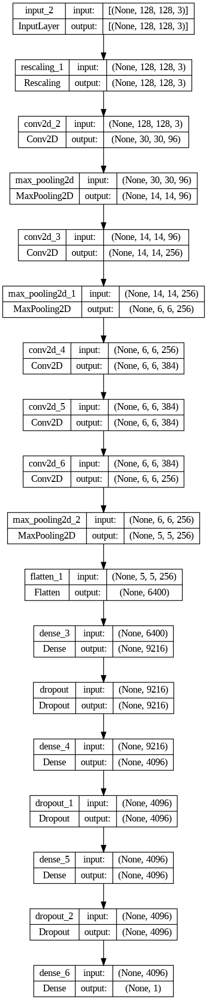

In [36]:
plot_model(alexnet_model, show_shapes=True)

In [37]:
alexnet_model.compile(optimizer = 'adam',
                    loss = 'binary_crossentropy',
                    metrics=['accuracy'])

In [38]:
alexnet_model_history = alexnet_model.fit(train_dataset,
                                          validation_data = test_dataset,
                                          callbacks = create_tensorboard_callback("alexnet_model"),
                                          class_weight = class_weights,
                                          epochs = 5)

Epoch 1/5
63/63 [==============================] - 12s 73ms/step - loss: 2.3992 - accuracy: 0.4983 - val_loss: 0.6932 - val_accuracy: 0.5000
Epoch 2/5
63/63 [==============================] - 5s 53ms/step - loss: 1.3875 - accuracy: 0.4905 - val_loss: 0.6931 - val_accuracy: 0.5000
Epoch 3/5
63/63 [==============================] - 7s 76ms/step - loss: 1.3866 - accuracy: 0.4830 - val_loss: 0.6931 - val_accuracy: 0.5000
Epoch 4/5
63/63 [==============================] - 6s 51ms/step - loss: 1.3864 - accuracy: 0.5010 - val_loss: 0.6932 - val_accuracy: 0.5000
Epoch 5/5
63/63 [==============================] - 6s 58ms/step - loss: 1.3865 - accuracy: 0.5058 - val_loss: 0.6932 - val_accuracy: 0.5000


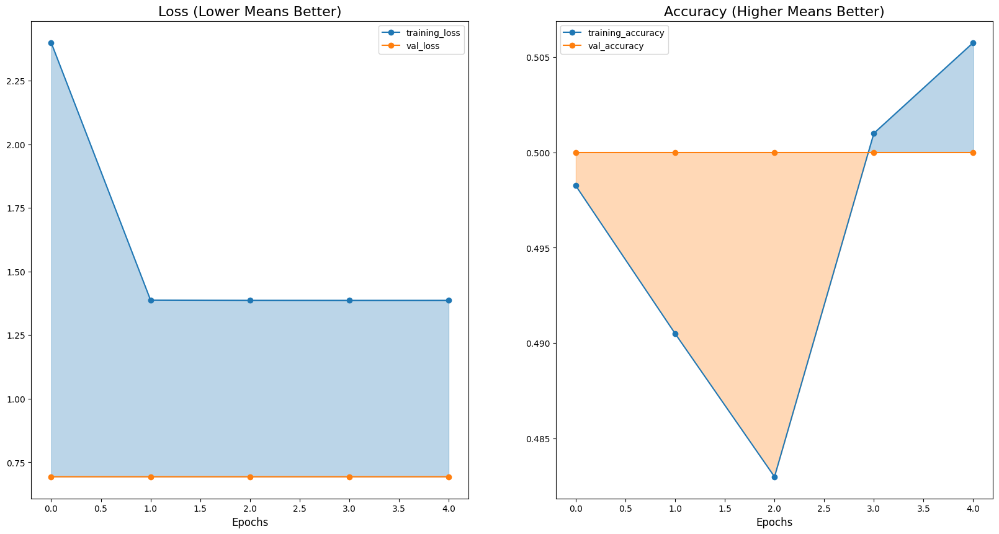

In [39]:
plot_loss_curves(alexnet_model_history)

# Error Analysis of alexnet model

In [40]:
true_labels = []
predicted_labels = []
images = []

for batch_images, batch_labels in val_dataset:
    batch_predictions = alexnet_model.predict(batch_images)
    batch_predicted_labels = np.round(batch_predictions)
    images.extend(batch_images)
    true_labels.extend(batch_labels)
    predicted_labels.extend(batch_predicted_labels)

true_labels = np.array(true_labels)
predicted_labels = np.array(predicted_labels)

2/2 [==============================] - 0s 8ms/step


In [41]:
alexnet_model_results = calculate_results(y_true = true_labels,
                                          y_pred = predicted_labels)
alexnet_model_results

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


{'accuracy': 50.0, 'precision': 0.25, 'recall': 0.5, 'f1': 0.3333333333333333}

Confusion Matrix:


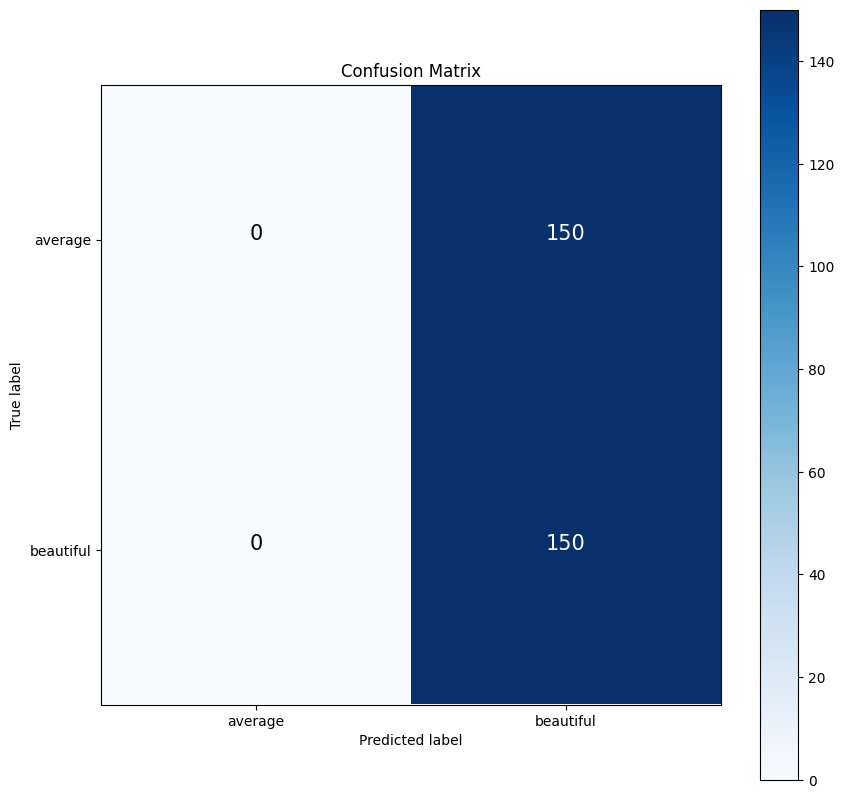

In [42]:
print("Confusion Matrix:")
make_confusion_matrix(y_true = true_labels,
                      y_pred = predicted_labels,
                      classes = class_names)

In [43]:
print("Classification Report:")
print(classification_report(true_labels, predicted_labels))

Classification Report:
              precision    recall  f1-score   support

         0.0       0.00      0.00      0.00       150
         1.0       0.50      1.00      0.67       150

    accuracy                           0.50       300
   macro avg       0.25      0.50      0.33       300
weighted avg       0.25      0.50      0.33       300



/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


ClassWise accuracy


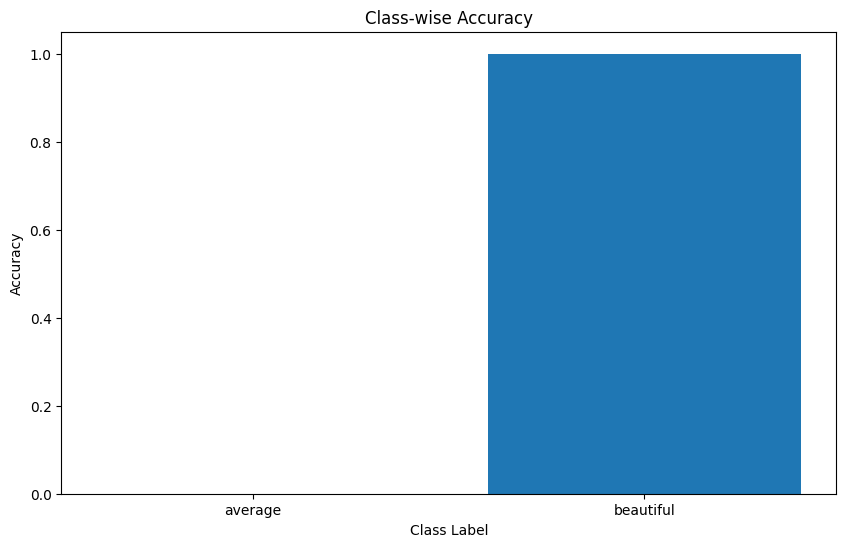

In [44]:
print("ClassWise accuracy")
plot_class_accuracy(num_classes = num_classes,
                    y_true = true_labels,
                    y_pred = predicted_labels,
                    classes = class_names)

Plot Misclassified images:


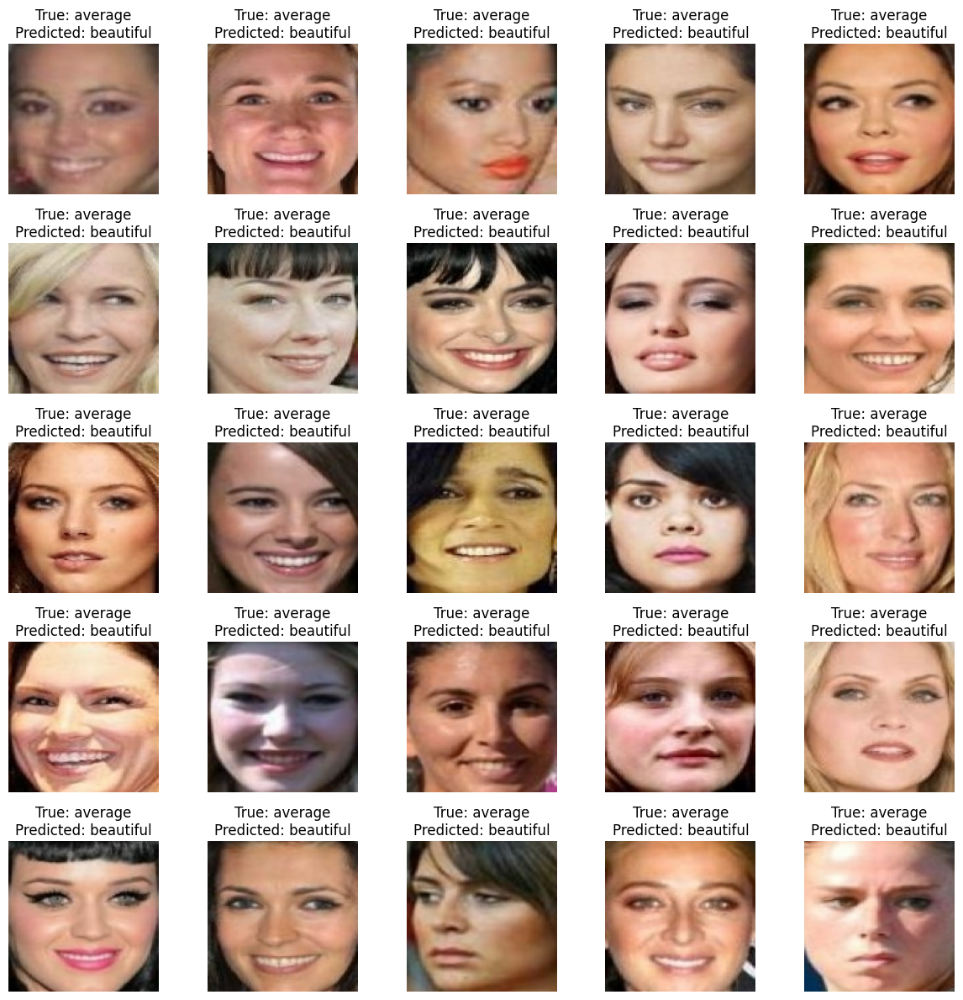

In [45]:
print("Plot Misclassified images:")
plot_random_misclassified_images(y_true = true_labels, y_pred = predicted_labels,
                                 images = images,
                                 classes = class_names)

# VGG 16 Model

In [46]:
input_layer = Input(shape=(128, 128, 3))

rescale = Rescaling(scale=1./255)(input_layer)
x = Conv2D(filters=64, kernel_size=(3, 3), activation='relu', padding='same')(rescale)
x = Conv2D(filters=64, kernel_size=(3, 3), activation='relu', padding='same')(x)
x = MaxPooling2D(pool_size=(2, 2), strides=(2, 2))(x)
x = Conv2D(filters=128, kernel_size=(3, 3), activation='relu', padding='same')(x)
x = Conv2D(filters=128, kernel_size=(3, 3), activation='relu', padding='same')(x)
x = MaxPooling2D(pool_size=(2, 2), strides=(2, 2))(x)
x = Conv2D(filters=256, kernel_size=(3, 3), activation='relu', padding='same')(x)
x = Conv2D(filters=256, kernel_size=(3, 3), activation='relu', padding='same')(x)
x = Conv2D(filters=256, kernel_size=(3, 3), activation='relu', padding='same')(x)
x = MaxPooling2D(pool_size=(2, 2), strides=(2, 2))(x)
x = Conv2D(filters=512, kernel_size=(3, 3), activation='relu', padding='same')(x)
x = Conv2D(filters=512, kernel_size=(3, 3), activation='relu', padding='same')(x)
x = Conv2D(filters=512, kernel_size=(3, 3), activation='relu', padding='same')(x)
x = MaxPooling2D(pool_size=(2, 2), strides=(2, 2))(x)
x = Conv2D(filters=512, kernel_size=(3, 3), activation='relu', padding='same')(x)
x = Conv2D(filters=512, kernel_size=(3, 3), activation='relu', padding='same')(x)
x = Conv2D(filters=512, kernel_size=(3, 3), activation='relu', padding='same')(x)
x = MaxPooling2D(pool_size=(2, 2), strides=(2, 2))(x)
x = Flatten()(x)
x = Dense(units=4096, activation='relu')(x)
x = Dense(units=4096, activation='relu')(x)
output_layer = Dense(1, activation='sigmoid')(x)

vgg16_model = Model(inputs=input_layer, outputs=output_layer)
vgg16_model.summary()

Model: "model_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_3 (InputLayer)        [(None, 128, 128, 3)]     0         
                                                                 
 rescaling_2 (Rescaling)     (None, 128, 128, 3)       0         
                                                                 
 conv2d_7 (Conv2D)           (None, 128, 128, 64)      1792      
                                                                 
 conv2d_8 (Conv2D)           (None, 128, 128, 64)      36928     
                                                                 
 max_pooling2d_3 (MaxPoolin  (None, 64, 64, 64)        0         
 g2D)                                                            
                                                                 
 conv2d_9 (Conv2D)           (None, 64, 64, 128)       73856     
                                                           

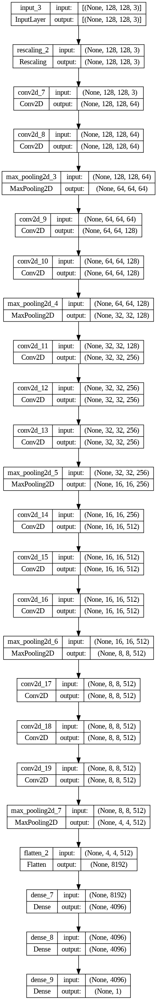

In [47]:
plot_model(vgg16_model, show_shapes=True)

In [48]:
vgg16_model.compile(optimizer='adam',
                    loss='binary_crossentropy',
                    metrics=['accuracy'])

In [49]:
vgg16_model_history = vgg16_model.fit(train_dataset,
                                      validation_data = test_dataset,
                                      callbacks = create_tensorboard_callback("vgg16_model"),
                                      class_weight = class_weights,
                                      epochs=5)

Epoch 1/5
63/63 [==============================] - 42s 407ms/step - loss: 1.5218 - accuracy: 0.5025 - val_loss: 0.6931 - val_accuracy: 0.5000
Epoch 2/5
63/63 [==============================] - 20s 262ms/step - loss: 1.3864 - accuracy: 0.4940 - val_loss: 0.6931 - val_accuracy: 0.5000
Epoch 3/5
63/63 [==============================] - 19s 265ms/step - loss: 1.3865 - accuracy: 0.4855 - val_loss: 0.6931 - val_accuracy: 0.5000
Epoch 4/5
63/63 [==============================] - 19s 272ms/step - loss: 1.3865 - accuracy: 0.4955 - val_loss: 0.6932 - val_accuracy: 0.5000
Epoch 5/5
63/63 [==============================] - 22s 264ms/step - loss: 1.3865 - accuracy: 0.4750 - val_loss: 0.6931 - val_accuracy: 0.5000


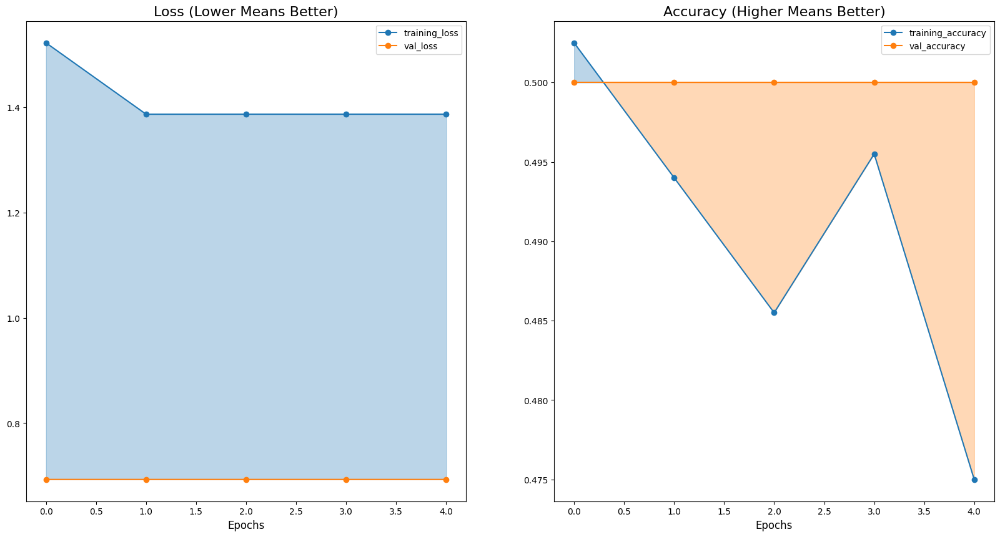

In [50]:
plot_loss_curves(vgg16_model_history)

# Error Analysis for vgg19 model

In [51]:
true_labels = []
predicted_labels = []
images = []

for batch_images, batch_labels in val_dataset:
    batch_predictions = vgg16_model.predict(batch_images)
    batch_predicted_labels = np.round(batch_predictions)
    images.extend(batch_images)
    true_labels.extend(batch_labels)
    predicted_labels.extend(batch_predicted_labels)

true_labels = np.array(true_labels)
predicted_labels = np.array(predicted_labels)

2/2 [==============================] - 0s 32ms/step


In [52]:
vgg16_model_results = calculate_results(y_true = true_labels,
                                        y_pred = predicted_labels)
vgg16_model_results

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


{'accuracy': 50.0, 'precision': 0.25, 'recall': 0.5, 'f1': 0.3333333333333333}

Confusion Matrix:


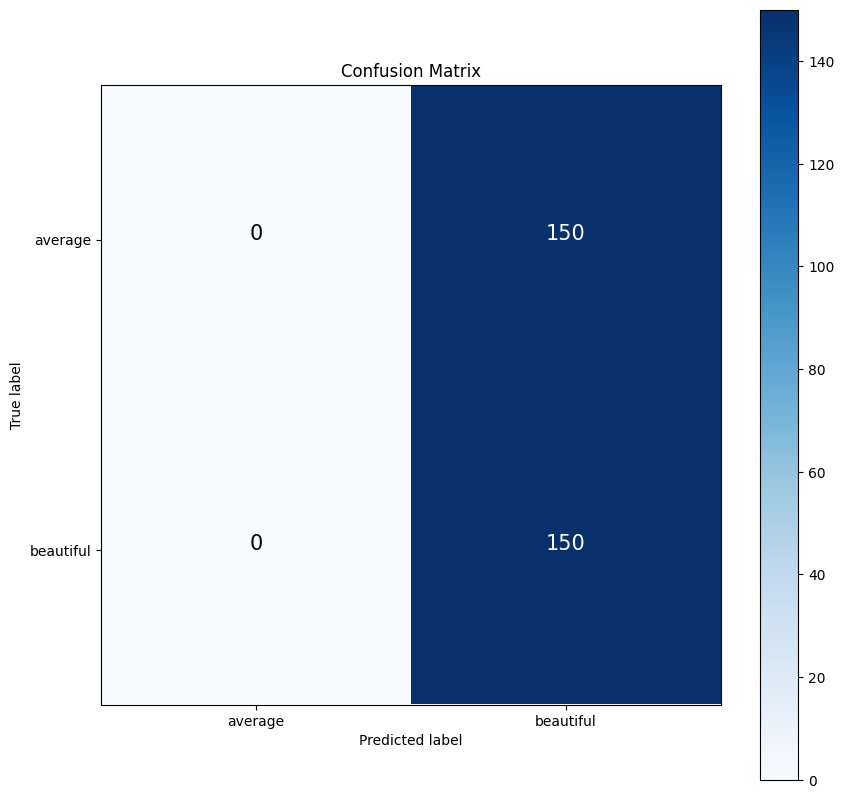

In [53]:
print("Confusion Matrix:")
make_confusion_matrix(y_true = true_labels,
                      y_pred = predicted_labels,
                      classes = class_names)

In [54]:
print("Classification Report:")
print(classification_report(true_labels, predicted_labels))

Classification Report:
              precision    recall  f1-score   support

         0.0       0.00      0.00      0.00       150
         1.0       0.50      1.00      0.67       150

    accuracy                           0.50       300
   macro avg       0.25      0.50      0.33       300
weighted avg       0.25      0.50      0.33       300



/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


ClassWise accuracy


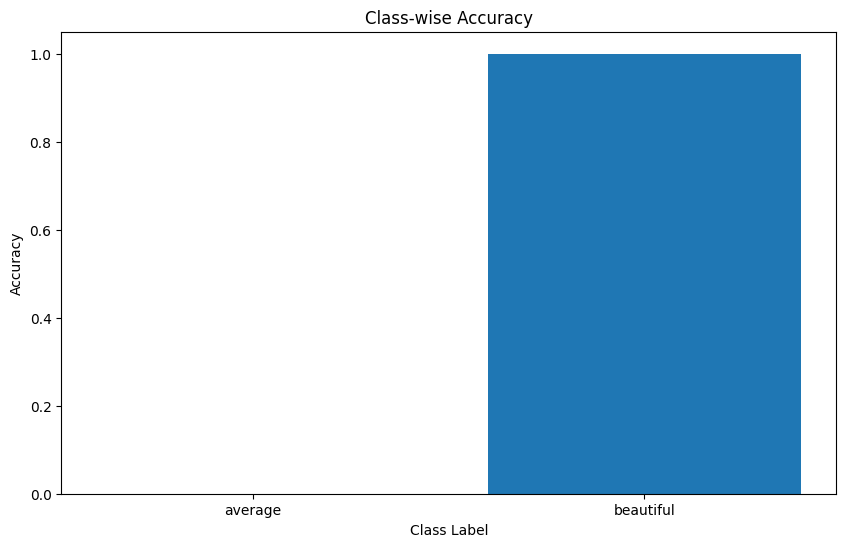

In [55]:
print("ClassWise accuracy")
plot_class_accuracy(num_classes = num_classes,
                    y_true = true_labels,
                    y_pred = predicted_labels,
                    classes = class_names)

Plot Misclassified images:


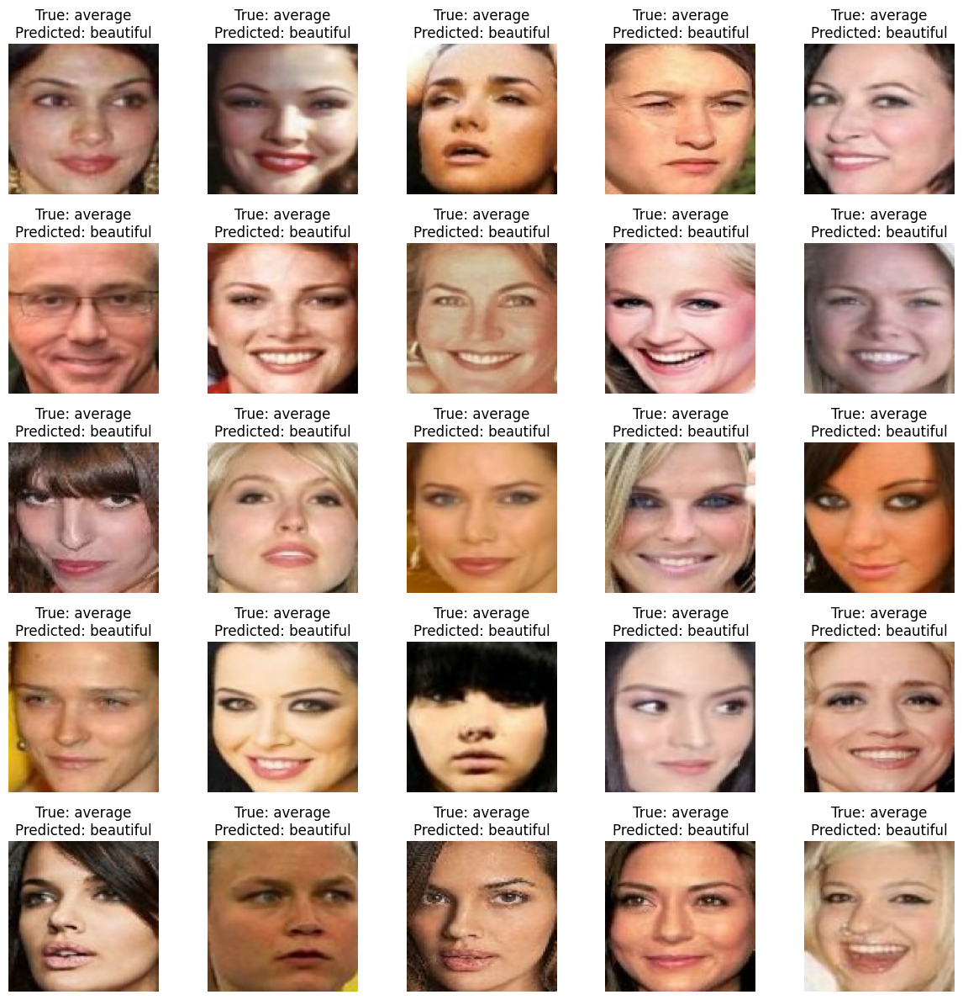

In [56]:
print("Plot Misclassified images:")
plot_random_misclassified_images(y_true = true_labels,
                                 y_pred = predicted_labels,
                                 images = images,
                                 classes = class_names)

# Resnet Model

In [57]:
def identity_block(inputs, filters, kernel_size, activation='relu'):
    x = Conv2D(filters, kernel_size, padding='same')(inputs)
    x = BatchNormalization()(x)
    x = Activation(activation)(x)
    x = Conv2D(filters, kernel_size, padding='same')(x)
    x = BatchNormalization()(x)

    if inputs.shape[-1] != filters:
      shortcut = Conv2D(filters, kernel_size=(1, 1), padding='same')(inputs)
      shortcut = BatchNormalization()(shortcut)

    else:
      shortcut = inputs

    x = Add()([shortcut, x])
    x = Activation(activation)(x)
    return x

input_layer = Input(shape=(128, 128, 3))

rescale = Rescaling(scale=1./255)(input_layer)
x = Conv2D(filters=64, kernel_size=(7, 7), strides=2, padding='same')(rescale)
x = BatchNormalization()(x)
x = Activation('relu')(x)
x = MaxPooling2D(pool_size=(3, 3), strides=2, padding='same')(x)
x = identity_block(x, filters=64, kernel_size=(3, 3))
x = identity_block(x, filters=64, kernel_size=(3, 3))
x = identity_block(x, filters=128, kernel_size=(3, 3))
x = identity_block(x, filters=128, kernel_size=(3, 3))
x = identity_block(x, filters=256, kernel_size=(3, 3))
x = identity_block(x, filters=256, kernel_size=(3, 3))
x = identity_block(x, filters=512, kernel_size=(3, 3))
x = identity_block(x, filters=512, kernel_size=(3, 3))
x = AveragePooling2D(pool_size=(7, 7))(x)
x = Flatten()(x)

output_layer = Dense(1, activation='sigmoid')(x)

resnet18_model = Model(inputs=input_layer, outputs=output_layer)

resnet18_model.summary()

Model: "model_3"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_4 (InputLayer)        [(None, 128, 128, 3)]        0         []                            
                                                                                                  
 rescaling_3 (Rescaling)     (None, 128, 128, 3)          0         ['input_4[0][0]']             
                                                                                                  
 conv2d_20 (Conv2D)          (None, 64, 64, 64)           9472      ['rescaling_3[0][0]']         
                                                                                                  
 batch_normalization (Batch  (None, 64, 64, 64)           256       ['conv2d_20[0][0]']           
 Normalization)                                                                             

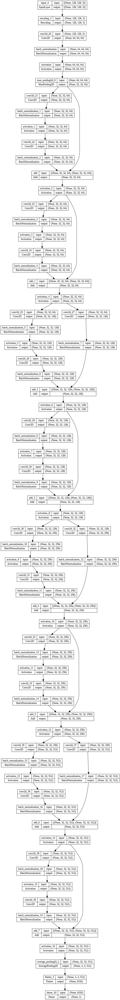

In [58]:
plot_model(resnet18_model, show_shapes=True)

In [59]:
resnet18_model.compile(optimizer='adam',
                    loss='binary_crossentropy',
                    metrics=['accuracy'])

In [60]:
resnet18_model_history = resnet18_model.fit(train_dataset,
                                            validation_data = test_dataset,
                                            callbacks = create_tensorboard_callback("resnet18_model"),
                                            class_weight=class_weights,
                                            epochs=3)

Epoch 1/3
63/63 [==============================] - 66s 642ms/step - loss: 1.4847 - accuracy: 0.7352 - val_loss: 32.5603 - val_accuracy: 0.5000
Epoch 2/3
63/63 [==============================] - 34s 512ms/step - loss: 0.7524 - accuracy: 0.8372 - val_loss: 4.1745 - val_accuracy: 0.5000
Epoch 3/3
63/63 [==============================] - 35s 514ms/step - loss: 0.5612 - accuracy: 0.8873 - val_loss: 1.7707 - val_accuracy: 0.5000


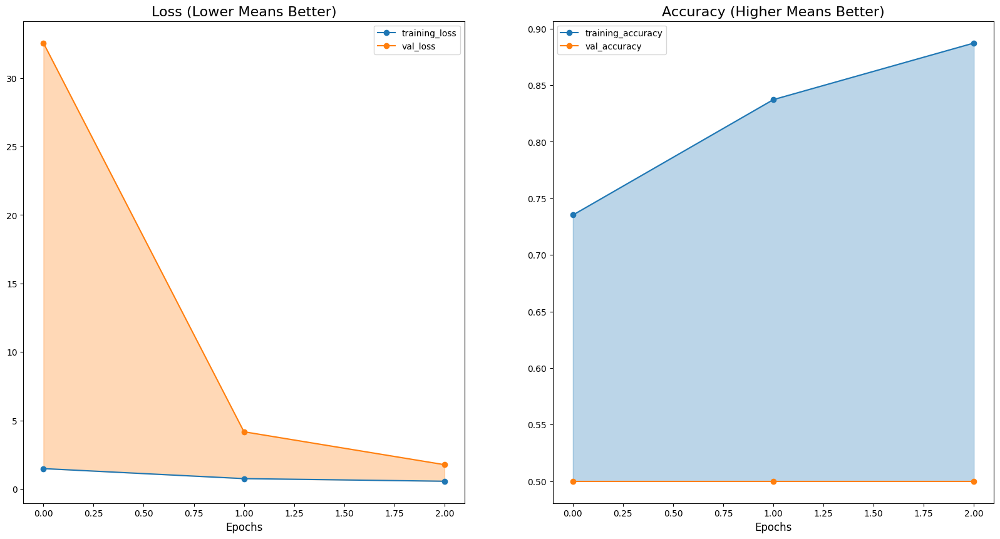

In [61]:
plot_loss_curves(resnet18_model_history)

# Error analysis of resnet model

In [62]:
true_labels = []
predicted_labels = []
images = []

for batch_images, batch_labels in val_dataset:
    batch_predictions = resnet18_model.predict(batch_images)
    batch_predicted_labels = np.round(batch_predictions)
    images.extend(batch_images)
    true_labels.extend(batch_labels)
    predicted_labels.extend(batch_predicted_labels)

true_labels = np.array(true_labels)
predicted_labels = np.array(predicted_labels)

2/2 [==============================] - 0s 69ms/step


In [63]:
resnet18_model_results = calculate_results(y_true = true_labels,
                                           y_pred = predicted_labels)
resnet18_model_results

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


{'accuracy': 50.0, 'precision': 0.25, 'recall': 0.5, 'f1': 0.3333333333333333}

Confusion Matrix:


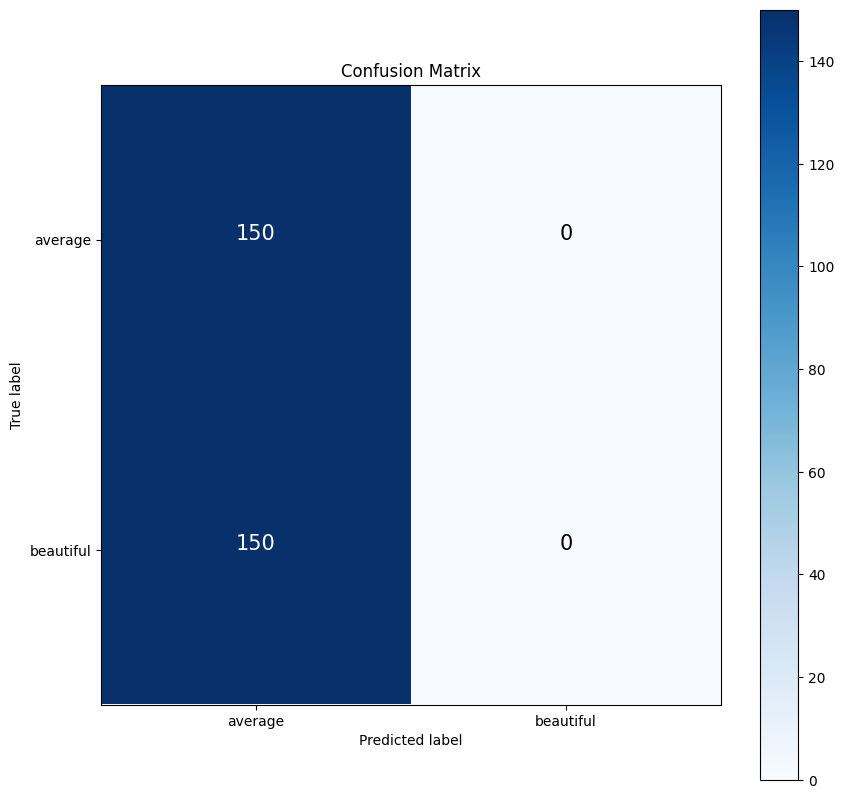

In [64]:
print("Confusion Matrix:")
make_confusion_matrix(y_true = true_labels,
                      y_pred = predicted_labels,
                      classes = class_names)

In [65]:
print("Classification Report:")
print(classification_report(true_labels, predicted_labels))

Classification Report:
              precision    recall  f1-score   support

         0.0       0.50      1.00      0.67       150
         1.0       0.00      0.00      0.00       150

    accuracy                           0.50       300
   macro avg       0.25      0.50      0.33       300
weighted avg       0.25      0.50      0.33       300



/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


ClassWise accuracy


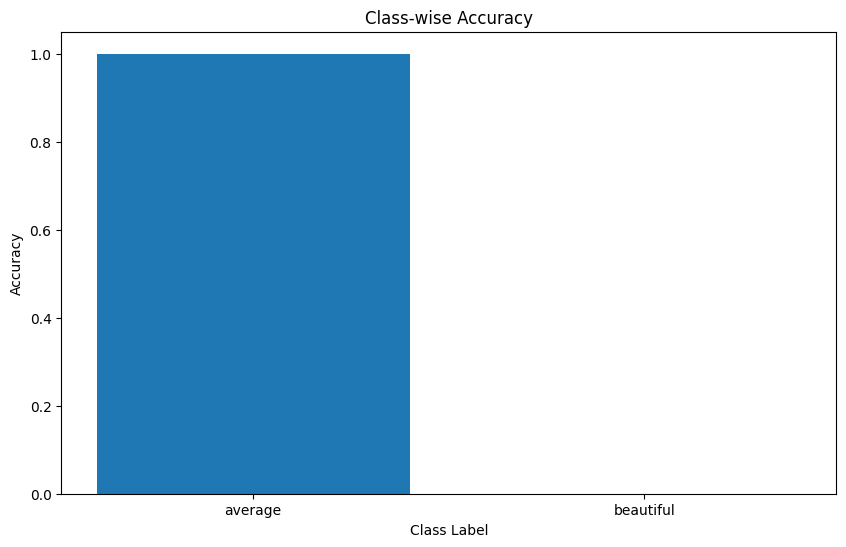

In [66]:
print("ClassWise accuracy")
plot_class_accuracy(num_classes = num_classes,
                    y_true = true_labels,
                    y_pred = predicted_labels,
                    classes = class_names)

Plot Misclassified images:


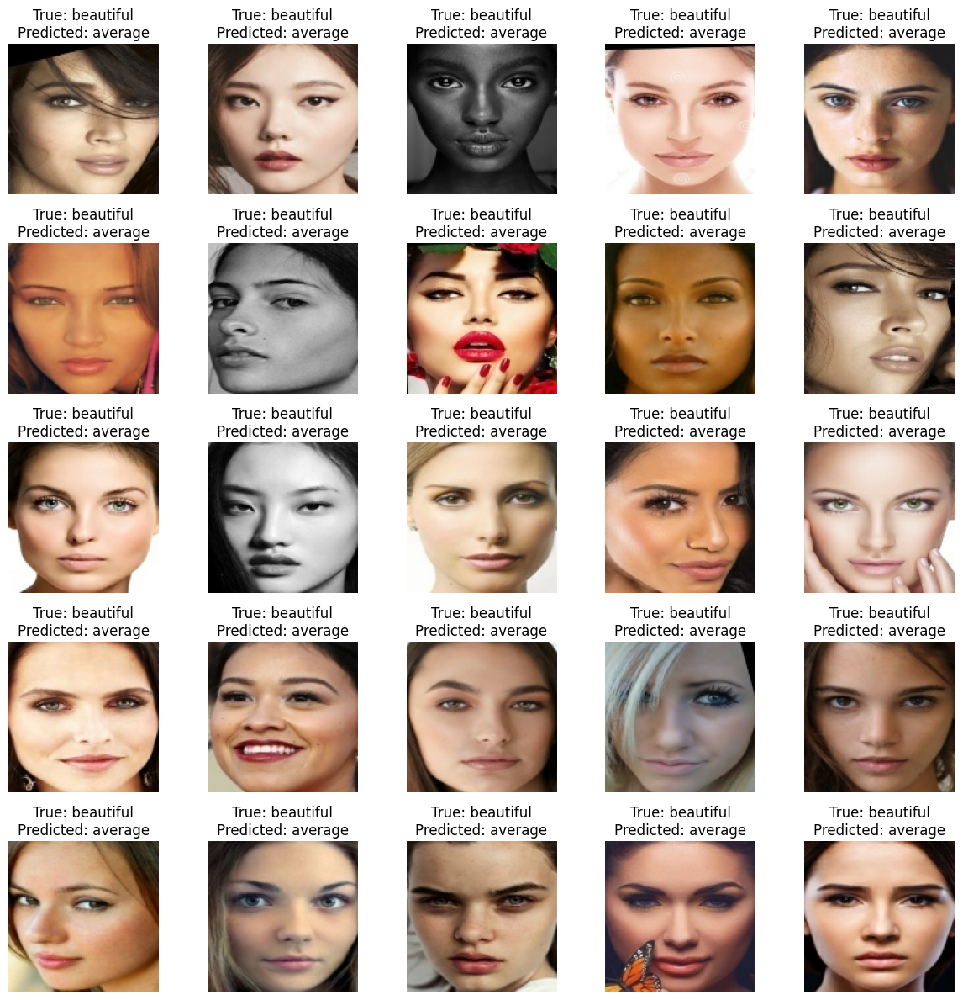

In [67]:
print("Plot Misclassified images:")
plot_random_misclassified_images(y_true = true_labels,
                                 y_pred = predicted_labels,
                                 images = images,
                                 classes = class_names)

# Inceptionv1 Model

In [68]:
def inception_module(x, filters):
    tower_1 = Conv2D(filters=filters[0], kernel_size=(1, 1), activation='relu', padding='same')(x)
    tower_1 = Conv2D(filters=filters[1], kernel_size=(3, 3), activation='relu', padding='same')(tower_1)
    tower_2 = Conv2D(filters=filters[2], kernel_size=(1, 1), activation='relu', padding='same')(x)
    tower_2 = Conv2D(filters=filters[3], kernel_size=(5, 5), activation='relu', padding='same')(tower_2)
    tower_3 = MaxPooling2D(pool_size=(3, 3), strides=(1, 1), padding='same')(x)
    tower_3 = Conv2D(filters=filters[4], kernel_size=(1, 1), activation='relu', padding='same')(tower_3)
    tower_4 = Conv2D(filters=filters[5], kernel_size=(1, 1), activation='relu', padding='same')(x)
    output = Concatenate(axis=-1)([tower_1, tower_2, tower_3, tower_4])
    return output

input_layer = Input(shape=(128, 128, 3))

rescale = Rescaling(scale=1./255)(input_layer)

x = Conv2D(filters=64, kernel_size=(7, 7), strides=(2, 2), activation='relu', padding='same')(rescale)
x = MaxPooling2D(pool_size=(3, 3), strides=(2, 2), padding='same')(x)
x = Conv2D(filters=192, kernel_size=(3, 3), strides=(1, 1), activation='relu', padding='same')(x)
x = MaxPooling2D(pool_size=(3, 3), strides=(2, 2), padding='same')(x)
x = inception_module(x, [64, 96, 128, 16, 32, 32])
x = inception_module(x, [128, 128, 192, 32, 96, 64])
x = MaxPooling2D(pool_size=(3, 3), strides=(2, 2), padding='same')(x)
x = inception_module(x, [192, 96, 208, 16, 48, 64])
x = inception_module(x, [160, 112, 224, 24, 64, 64])
x = inception_module(x, [128, 128, 256, 24, 64, 64])
x = inception_module(x, [112, 144, 288, 32, 64, 64])
x = inception_module(x, [256, 160, 320, 32, 128, 128])
x = MaxPooling2D(pool_size=(3, 3), strides=(2, 2), padding='same')(x)
x = inception_module(x, [256, 160, 320, 32, 128, 128])
x = inception_module(x, [384, 192, 384, 48, 128, 128])
x = GlobalAveragePooling2D()(x)
x = Dropout(0.4)(x)
x = Dense(units=512, activation='relu')(x)

output_layer = Dense(1, activation='sigmoid')(x)

inceptionv1_model = Model(inputs=input_layer, outputs=output_layer)
inceptionv1_model.summary()

Model: "model_4"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_5 (InputLayer)        [(None, 128, 128, 3)]        0         []                            
                                                                                                  
 rescaling_4 (Rescaling)     (None, 128, 128, 3)          0         ['input_5[0][0]']             
                                                                                                  
 conv2d_40 (Conv2D)          (None, 64, 64, 64)           9472      ['rescaling_4[0][0]']         
                                                                                                  
 max_pooling2d_9 (MaxPoolin  (None, 32, 32, 64)           0         ['conv2d_40[0][0]']           
 g2D)                                                                                       

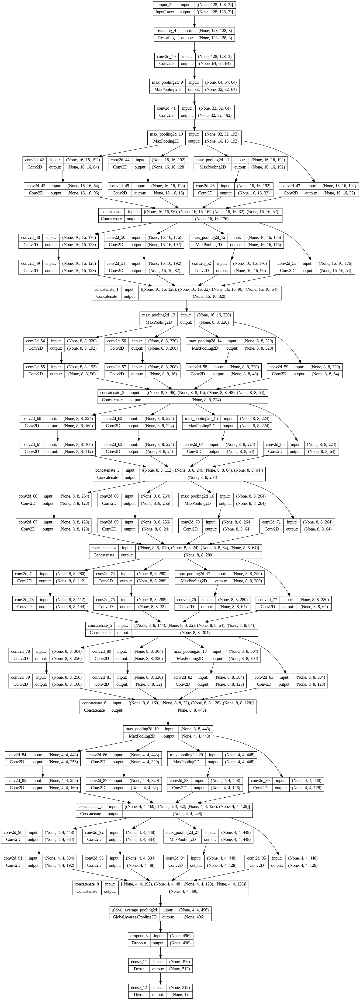

In [69]:
plot_model(inceptionv1_model, show_shapes=True)

In [70]:
inceptionv1_model.compile(optimizer='adam',
                          loss='binary_crossentropy',
                          metrics=['accuracy'])

In [101]:
inceptionv1_model_history = inceptionv1_model.fit(train_dataset,
                                                  validation_data = test_dataset,
                                                  callbacks = create_tensorboard_callback("inceptionv1_model"),
                                                  class_weight = class_weights,
                                                  epochs = 5)

Epoch 1/5
63/63 [==============================] - 10s 78ms/step - loss: 1.3876 - accuracy: 0.5040 - val_loss: 0.6932 - val_accuracy: 0.5000
Epoch 2/5
63/63 [==============================] - 7s 80ms/step - loss: 1.3865 - accuracy: 0.4935 - val_loss: 0.6932 - val_accuracy: 0.5000
Epoch 3/5
63/63 [==============================] - 7s 74ms/step - loss: 1.3865 - accuracy: 0.4947 - val_loss: 0.6932 - val_accuracy: 0.5000
Epoch 4/5
63/63 [==============================] - 7s 71ms/step - loss: 1.3867 - accuracy: 0.5013 - val_loss: 0.6932 - val_accuracy: 0.5000
Epoch 5/5
63/63 [==============================] - 7s 72ms/step - loss: 1.3868 - accuracy: 0.4950 - val_loss: 0.6935 - val_accuracy: 0.5033


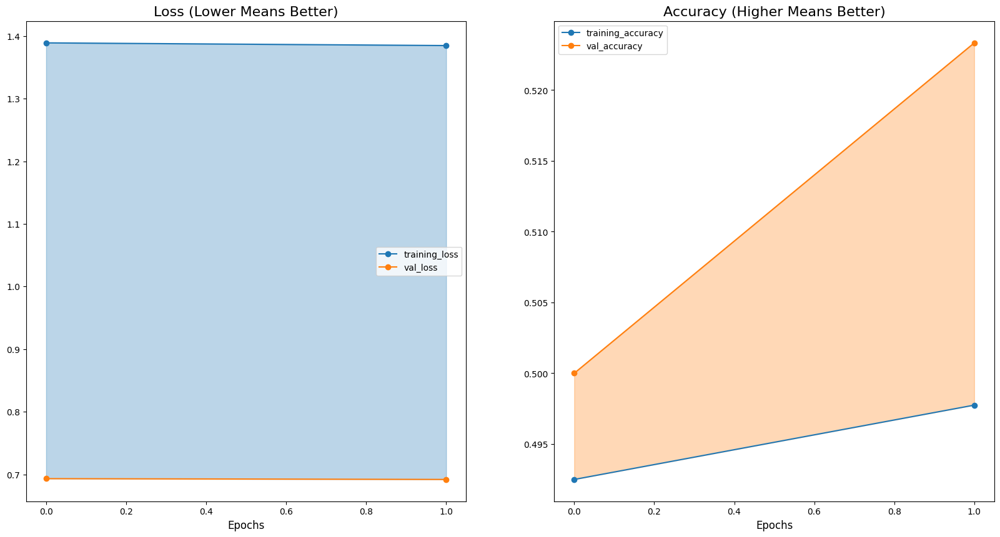

In [73]:
plot_loss_curves(inceptionv1_model_history)

# Error analysis of inceptionnet model

In [72]:
true_labels = []
predicted_labels = []
images = []

for batch_images, batch_labels in val_dataset:
    batch_predictions = inceptionv1_model.predict(batch_images)
    batch_predicted_labels = np.round(batch_predictions)
    images.extend(batch_images)
    true_labels.extend(batch_labels)
    predicted_labels.extend(batch_predicted_labels)

true_labels = np.array(true_labels)
predicted_labels = np.array(predicted_labels)

2/2 [==============================] - 0s 12ms/step


In [74]:
inceptionv1_model_results = calculate_results(y_true = true_labels,
                                              y_pred = predicted_labels)
inceptionv1_model_results

{'accuracy': 55.00000000000001,
 'precision': 0.6105216622458001,
 'recall': 0.55,
 'f1': 0.4786235662148071}

Confusion Matrix:


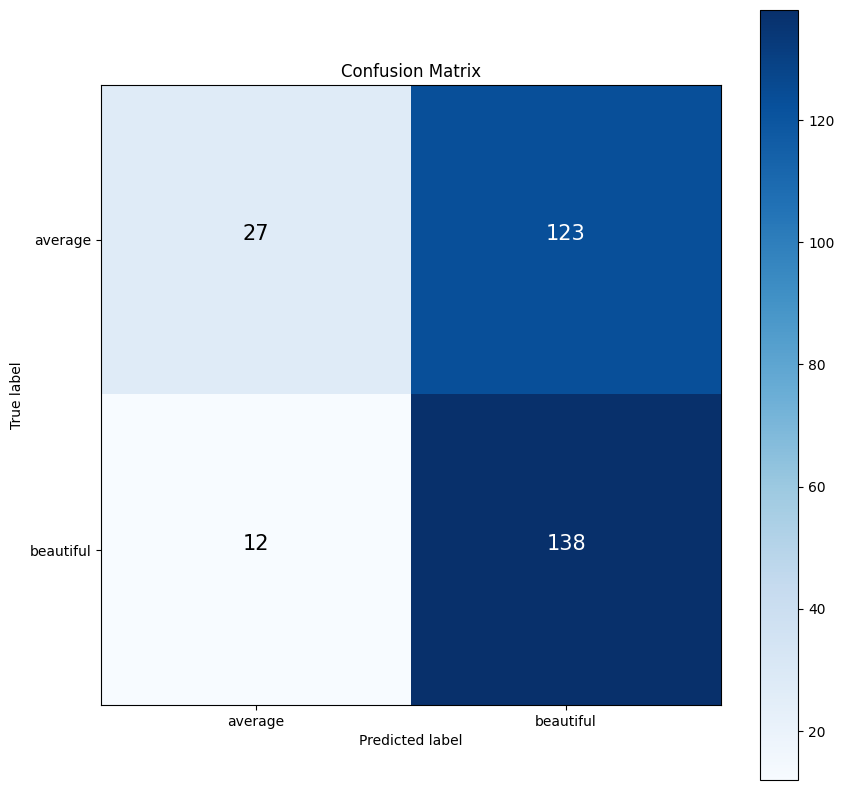

In [75]:
print("Confusion Matrix:")
make_confusion_matrix(y_true = true_labels,
                      y_pred = predicted_labels,
                      classes = class_names)

In [76]:
print("Classification Report:")
print(classification_report(true_labels, predicted_labels))

Classification Report:
              precision    recall  f1-score   support

         0.0       0.69      0.18      0.29       150
         1.0       0.53      0.92      0.67       150

    accuracy                           0.55       300
   macro avg       0.61      0.55      0.48       300
weighted avg       0.61      0.55      0.48       300



ClassWise accuracy


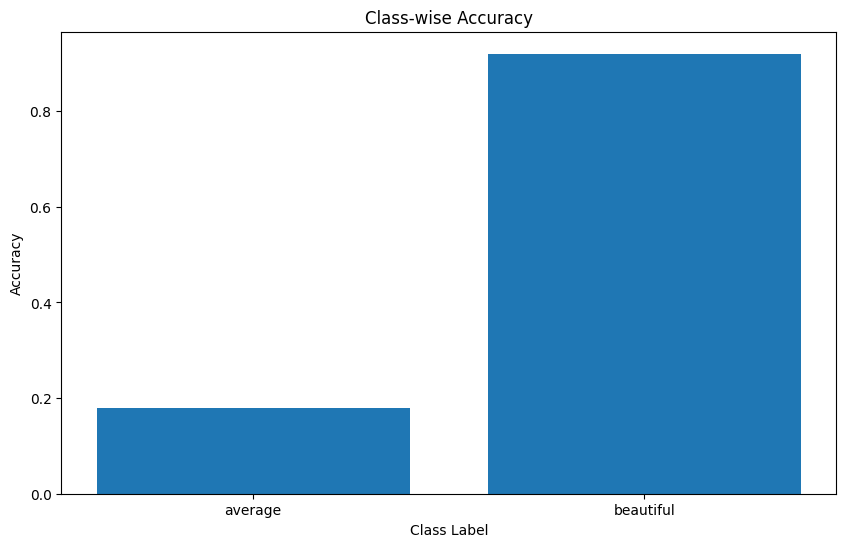

In [77]:
print("ClassWise accuracy")
plot_class_accuracy(num_classes = num_classes,
                    y_true = true_labels,
                    y_pred = predicted_labels,
                    classes = class_names)

Plot Misclassified images:


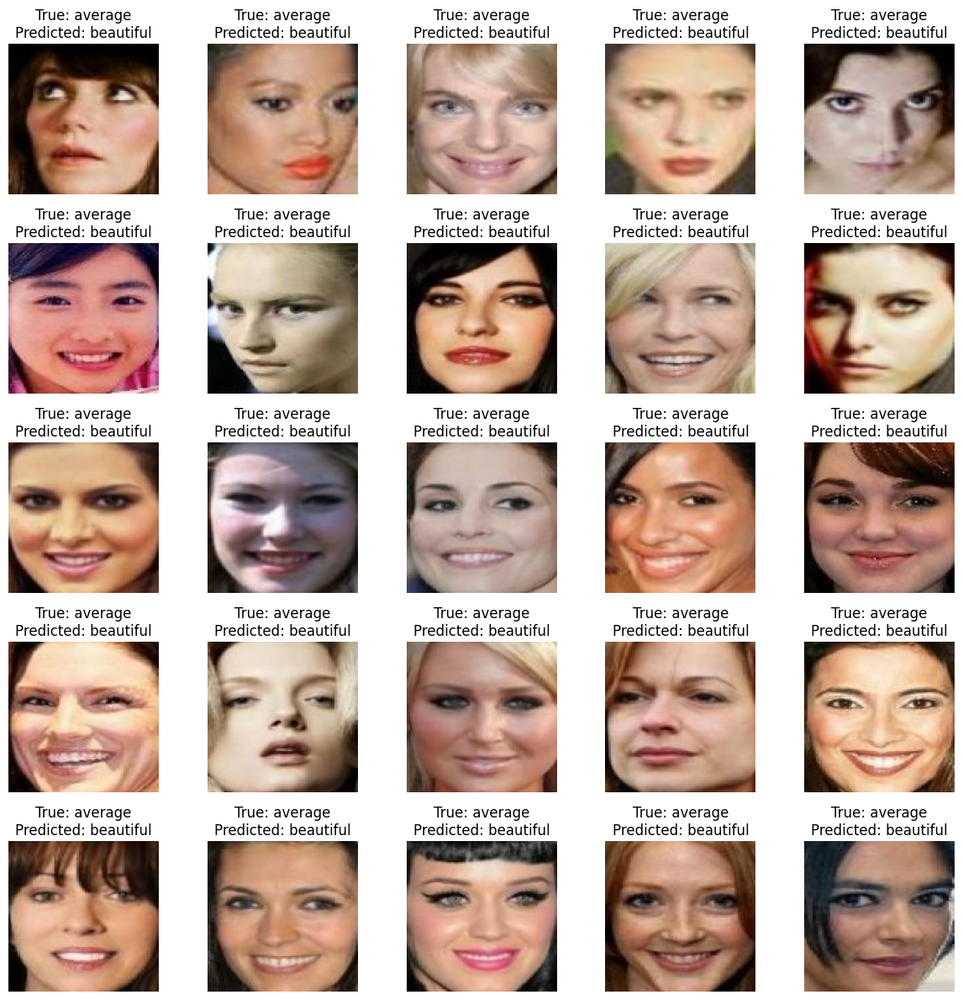

In [78]:
print("Plot Misclassified images:")
plot_random_misclassified_images(y_true = true_labels,
                                 y_pred = predicted_labels,
                                 images = images,
                                 classes = class_names)

# Mobilenets V1

In [79]:
input_layer = Input(shape=(128, 128, 3))

rescale = Rescaling(scale=1./255)(input_layer)
x = Conv2D(filters=32, kernel_size=(3, 3), strides=(2, 2), padding='same')(rescale)
x = BatchNormalization()(x)
x = Activation('relu')(x)
x = DepthwiseConv2D(kernel_size=(3, 3), strides=(1, 1), padding='same')(x)
x = BatchNormalization()(x)
x = Activation('relu')(x)
x = Conv2D(filters=64, kernel_size=(1, 1), strides=(1, 1), padding='same')(x)
x = BatchNormalization()(x)
x = Activation('relu')(x)
x = BatchNormalization()(x)
x = Activation('relu')(x)

x = Conv2D(256, kernel_size=(1, 1), strides=(1, 1), padding='same')(x)
x = BatchNormalization()(x)
x = Activation('relu')(x)

x = DepthwiseConv2D(kernel_size=(3, 3), strides=(1, 1), padding='same')(x)
x = BatchNormalization()(x)
x = Activation('relu')(x)

x = Conv2D(filters=256, kernel_size=(1, 1), strides=(1, 1), padding='same')(x)
x = BatchNormalization()(x)
x = Activation('relu')(x)

x = DepthwiseConv2D(kernel_size=(3, 3), strides=(2, 2), padding='same')(x)
x = BatchNormalization()(x)
x = Activation('relu')(x)

x = Conv2D(filters=512, kernel_size=(1, 1), strides=(1, 1), padding='same')(x)
x = BatchNormalization()(x)
x = Activation('relu')(x)


for _ in range(5):
    x = DepthwiseConv2D(kernel_size=(3, 3), strides=(1, 1), padding='same')(x)
    x = BatchNormalization()(x)
    x = Activation('relu')(x)

    x = Conv2D(filters=512, kernel_size=(1, 1), strides=(1, 1), padding='same')(x)
    x = BatchNormalization()(x)
    x = Activation('relu')(x)

x = DepthwiseConv2D(kernel_size=(3, 3), strides=(2, 2), padding='same')(x)
x = BatchNormalization()(x)
x = Activation('relu')(x)

x = Conv2D(1024, kernel_size=(1, 1), strides=(1, 1), padding='same')(x)
x = BatchNormalization()(x)
x = Activation('relu')(x)

x = DepthwiseConv2D(kernel_size=(3, 3), strides=(2, 2), padding='same')(x)
x = BatchNormalization()(x)
x = Activation('relu')(x)

x = Conv2D(filters=1024, kernel_size=(1, 1), strides=(1, 1), padding='same')(x)
x = BatchNormalization()(x)
x = Activation('relu')(x)

x = GlobalAveragePooling2D()(x)
x = Dense(units=512, activation='relu')(x)

output_layer = Dense(1, activation='sigmoid')(x)
mobilenetv1_model = Model(inputs=input_layer, outputs=output_layer)

mobilenetv1_model.summary()

Model: "model_5"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_6 (InputLayer)        [(None, 128, 128, 3)]     0         
                                                                 
 rescaling_5 (Rescaling)     (None, 128, 128, 3)       0         
                                                                 
 conv2d_96 (Conv2D)          (None, 64, 64, 32)        896       
                                                                 
 batch_normalization_20 (Ba  (None, 64, 64, 32)        128       
 tchNormalization)                                               
                                                                 
 activation_17 (Activation)  (None, 64, 64, 32)        0         
                                                                 
 depthwise_conv2d (Depthwis  (None, 64, 64, 32)        320       
 eConv2D)                                                  

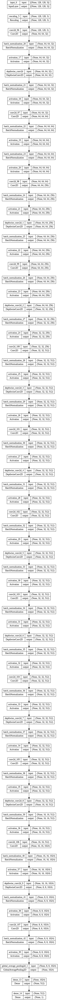

In [80]:
plot_model(mobilenetv1_model, show_shapes=True)

In [81]:
mobilenetv1_model.compile(optimizer='adam',
                          loss='binary_crossentropy',
                          metrics=['accuracy'])

In [82]:
mobilenetv1_model_history = mobilenetv1_model.fit(train_dataset,
                                                  validation_data = test_dataset,
                                                  callbacks = create_tensorboard_callback("mobilenetv1_model"),
                                                  class_weight = class_weights,
                                                  epochs=3)

Epoch 1/3
63/63 [==============================] - 56s 550ms/step - loss: 0.8771 - accuracy: 0.8102 - val_loss: 1.1422 - val_accuracy: 0.5000
Epoch 2/3
63/63 [==============================] - 33s 487ms/step - loss: 0.4607 - accuracy: 0.9082 - val_loss: 1.3573 - val_accuracy: 0.5000
Epoch 3/3
63/63 [==============================] - 34s 506ms/step - loss: 0.3103 - accuracy: 0.9445 - val_loss: 1.7364 - val_accuracy: 0.5000


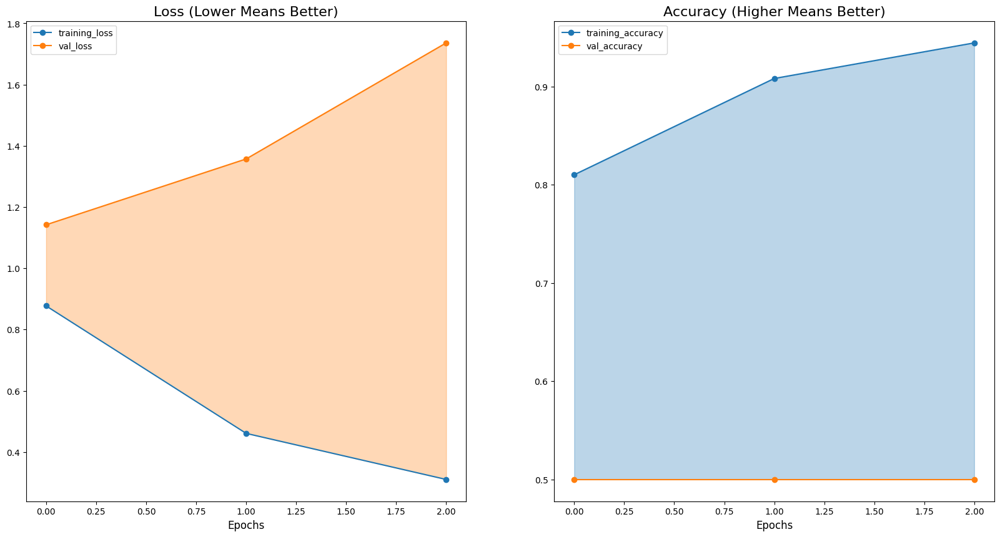

In [83]:
plot_loss_curves(mobilenetv1_model_history)

In [84]:
true_labels = []
predicted_labels = []
images = []

for batch_images, batch_labels in val_dataset:
    batch_predictions = mobilenetv1_model.predict(batch_images)
    batch_predicted_labels = np.round(batch_predictions)

    images.extend(batch_images)
    true_labels.extend(batch_labels)
    predicted_labels.extend(batch_predicted_labels)


true_labels = np.array(true_labels)
predicted_labels = np.array(predicted_labels)

2/2 [==============================] - 1s 367ms/step


In [85]:
mobilenetv1_model_results = calculate_results(y_true = true_labels,
                                              y_pred = predicted_labels)
mobilenetv1_model_results

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


{'accuracy': 50.0, 'precision': 0.25, 'recall': 0.5, 'f1': 0.3333333333333333}

Confusion Matrix:


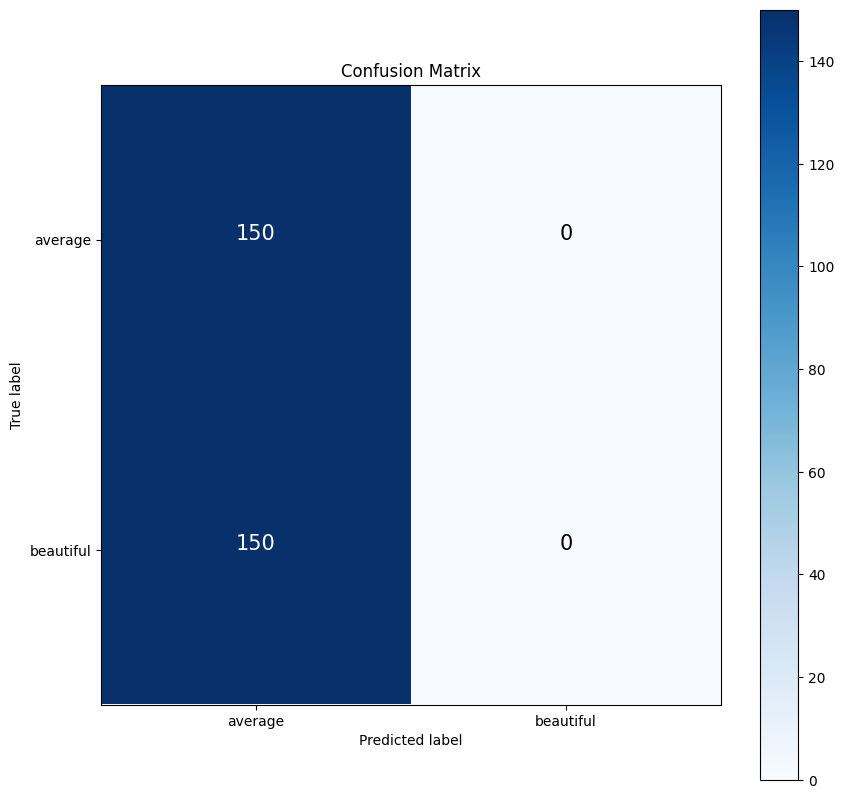

In [86]:
print("Confusion Matrix:")
make_confusion_matrix(y_true = true_labels,
                      y_pred = predicted_labels,
                      classes = class_names)

In [87]:
print("Classification Report:")
print(classification_report(true_labels, predicted_labels))

Classification Report:
              precision    recall  f1-score   support

         0.0       0.50      1.00      0.67       150
         1.0       0.00      0.00      0.00       150

    accuracy                           0.50       300
   macro avg       0.25      0.50      0.33       300
weighted avg       0.25      0.50      0.33       300



/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


ClassWise accuracy


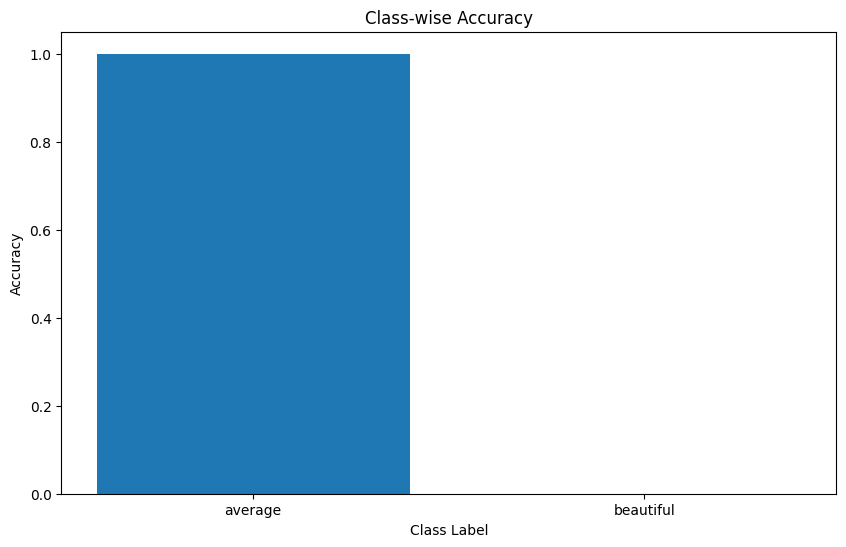

In [88]:
print("ClassWise accuracy")
plot_class_accuracy(num_classes = num_classes,
                    y_true = true_labels,
                    y_pred = predicted_labels,
                    classes = class_names)

Plot Misclassified images:


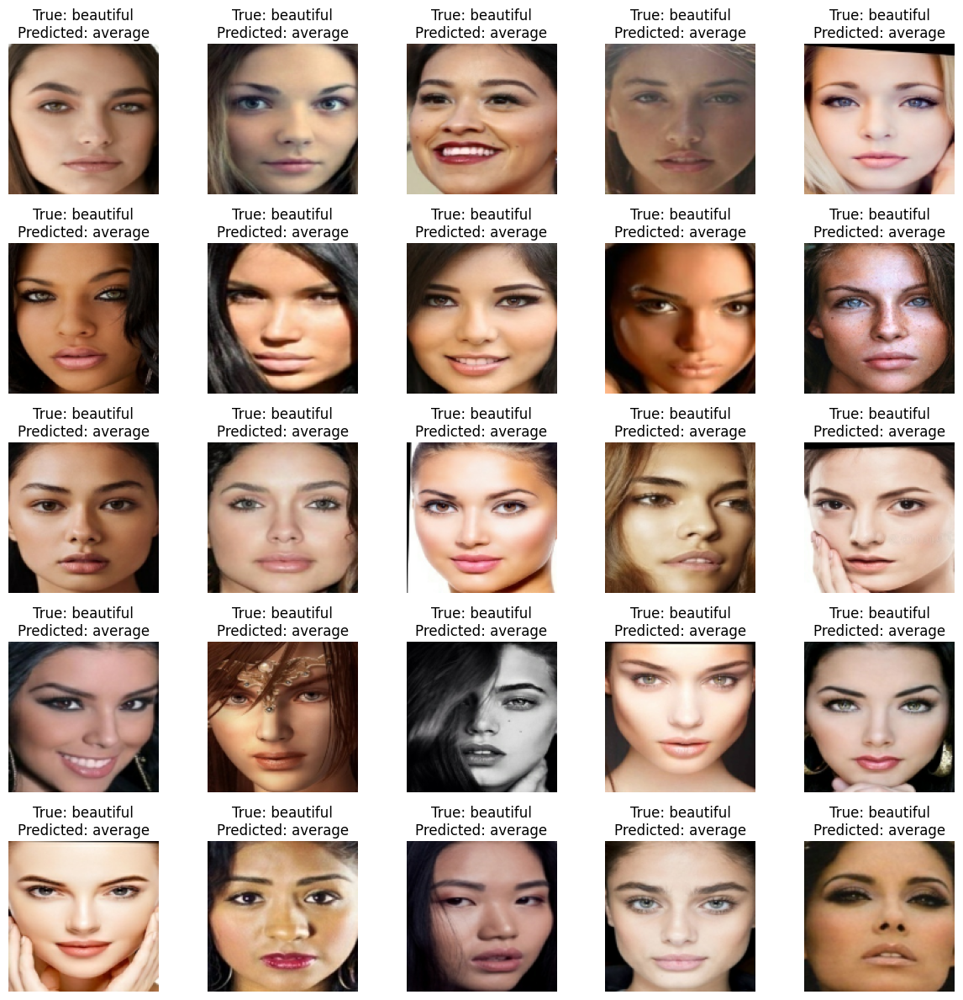

In [89]:
print("Plot Misclassified images:")
plot_random_misclassified_images(y_true = true_labels,
                                 y_pred = predicted_labels,
                                 images = images,
                                 classes = class_names)

# EfficientNetB0

In [90]:
def block(inputs, num_repeats, num_filters, expand_ratio, kernel_size):
    expansion = Conv2D(int(num_filters * expand_ratio), 1, strides=1, padding='same')(inputs)
    expansion = BatchNormalization()(expansion)
    expansion = Activation('swish')(expansion)

    x = Conv2D(num_filters, kernel_size, strides=1, padding='same')(expansion)
    x = BatchNormalization()(x)
    x = Activation('swish')(x)

    if num_repeats > 1:
        x = Conv2D(num_filters, kernel_size, strides=1, padding='same')(x)
        x = BatchNormalization()(x)
        x = Activation('swish')(x)

    if expand_ratio != 1:
        expansion = Conv2D(num_filters, 1, strides=1, padding='same')(expansion)
        expansion = BatchNormalization()(expansion)
        expansion = Activation('swish')(expansion)

    x = Add()([expansion, x])
    return x

input_layer = Input(shape=(128, 128, 3))

rescale = Rescaling(scale=1./255)(input_layer)
x = Conv2D(32, 3, strides=2, padding='same')(rescale)
x = BatchNormalization()(x)
x = Activation('swish')(x)

x = block(x, 1, 16, 1, 3)
x = block(x, 2, 24, 6, 3)
x = block(x, 2, 40, 6, 5)
x = block(x, 3, 80, 6, 3)
x = block(x, 3, 112, 6, 5)
x = block(x, 4, 192, 6, 5)
x = block(x, 1, 320, 6, 3)

x = Conv2D(1280, 1, strides=1, padding='same')(x)
x = BatchNormalization()(x)
x = Activation('swish')(x)

x = GlobalAveragePooling2D()(x)
output_layer = Dense(1, activation='sigmoid')(x)

efficientnetb0_model = Model(inputs=input_layer, outputs=output_layer)
efficientnetb0_model.summary()

Model: "model_6"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_7 (InputLayer)        [(None, 128, 128, 3)]        0         []                            
                                                                                                  
 rescaling_6 (Rescaling)     (None, 128, 128, 3)          0         ['input_7[0][0]']             
                                                                                                  
 conv2d_108 (Conv2D)         (None, 64, 64, 32)           896       ['rescaling_6[0][0]']         
                                                                                                  
 batch_normalization_43 (Ba  (None, 64, 64, 32)           128       ['conv2d_108[0][0]']          
 tchNormalization)                                                                          

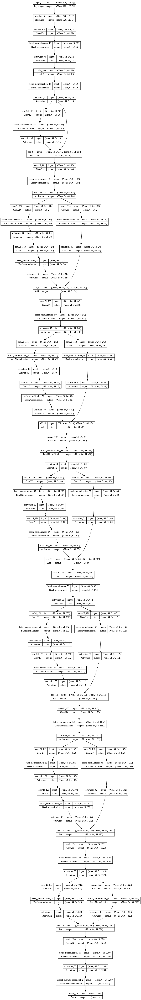

In [91]:
plot_model(efficientnetb0_model, show_shapes=True)

In [92]:
efficientnetb0_model.compile(optimizer='adam',
                            loss='binary_crossentropy',
                            metrics=['accuracy'])

In [93]:
efficientnetb0_model_history = efficientnetb0_model.fit(train_dataset,
                                                        validation_data = test_dataset,
                                                        callbacks = create_tensorboard_callback("efficientnetb0_model"),
                                                        class_weight = class_weights,
                                                        epochs = 3)

Epoch 1/3


ResourceExhaustedError: ignored

In [ ]:
plot_loss_curves(efficientnetb0_model_history)

In [ ]:
true_labels = []
predicted_labels = []
images = []

for batch_images, batch_labels in val_dataset:
    batch_predictions = efficientnetb0_model.predict(batch_images)
    batch_predicted_labels = np.round(batch_predictions)
    images.extend(batch_images)
    true_labels.extend(batch_labels)
    predicted_labels.extend(batch_predicted_labels)

true_labels = np.array(true_labels)
predicted_labels = np.array(predicted_labels)

In [ ]:
efficientnetb0_model_results = calculate_results(y_true = true_labels,
                                                y_pred = predicted_labels)
efficientnetb0_model_results

In [ ]:
print("Confusion Matrix:")
make_confusion_matrix(y_true = true_labels,
                      y_pred = predicted_labels,
                      classes = class_names)

In [ ]:
print("Classification Report:")
print(classification_report(true_labels, predicted_labels))

In [ ]:
print("ClassWise accuracy")
plot_class_accuracy(num_classes = num_classes,
                    y_true = true_labels,
                    y_pred = predicted_labels,
                    classes = class_names)

In [ ]:
print("Plot Misclassified images:")
plot_random_misclassified_images(y_true = true_labels,
                                 y_pred = predicted_labels,
                                 images = images,
                                 classes = class_names)

# Ensemble

In [94]:
input_layer = Input(shape=(128, 128, 3))

y_1 = lenet_model(input_layer)
y_2 = resnet18_model(input_layer)

output_layer = 0.5*y_1 + 0.5*y_1

ensemble_model = Model(inputs = input_layer, outputs = output_layer)
ensemble_model.summary()

Model: "model_7"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_8 (InputLayer)        [(None, 128, 128, 3)]        0         []                            
                                                                                                  
 model (Functional)          (None, 1)                    1741241   ['input_8[0][0]']             
                                                                                                  
 tf.math.multiply (TFOpLamb  (None, 1)                    0         ['model[0][0]']               
 da)                                                                                              
                                                                                                  
 tf.math.multiply_1 (TFOpLa  (None, 1)                    0         ['model[0][0]']         

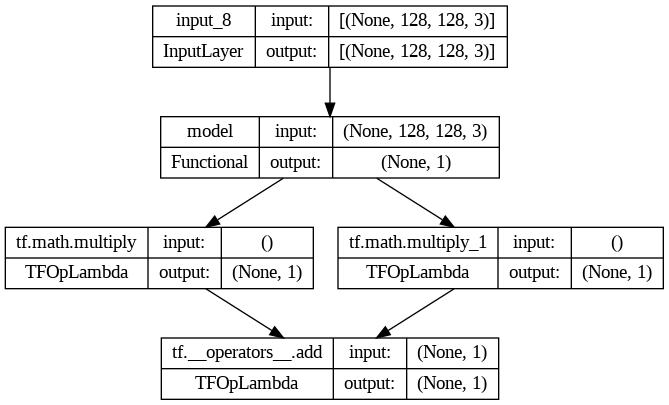

In [95]:
plot_model(ensemble_model, show_shapes=True)

# Error analysis

In [96]:
all_model_results = pd.DataFrame({"Lenet_Model": lenet_model_results,
                                  "Alexnet_Model": alexnet_model_results,
                                  "VGG16_Model": vgg16_model_results,
                                  "Resnet18_Model": resnet18_model_results,
                                  "Inceptionv1_Model": inceptionv1_model_results,
                                  "mobilenetv1_Model": mobilenetv1_model_results,
                                  # "efficientnetb0_Model": efficientnetb0_model_results
                                  })

all_model_results = all_model_results.transpose()
all_model_results

,accuracy,precision,recall,f1
Lenet_Model,81.666667,0.817019,0.816667,0.816616
Alexnet_Model,50.000000,0.250000,0.500000,0.333333
VGG16_Model,50.000000,0.250000,0.500000,0.333333
Resnet18_Model,50.000000,0.250000,0.500000,0.333333
Inceptionv1_Model,55.000000,0.610522,0.550000,0.478624
mobilenetv1_Model,50.000000,0.250000,0.500000,0.333333


In [97]:
all_model_results["accuracy"] = all_model_results["accuracy"]/100

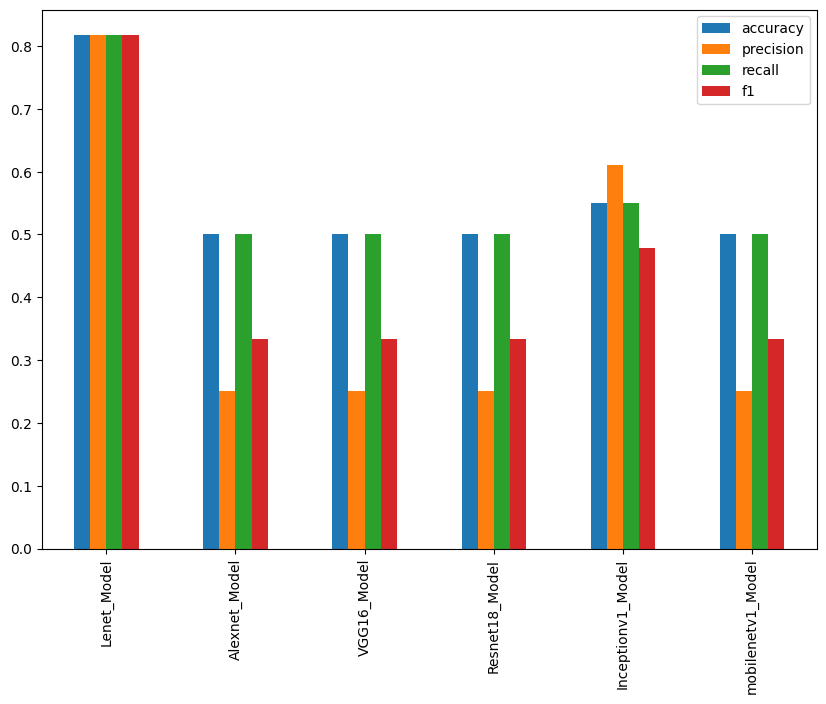

In [98]:
all_model_results.plot(kind="bar", figsize=(10, 7)).legend(bbox_to_anchor=(1.0, 1.0));

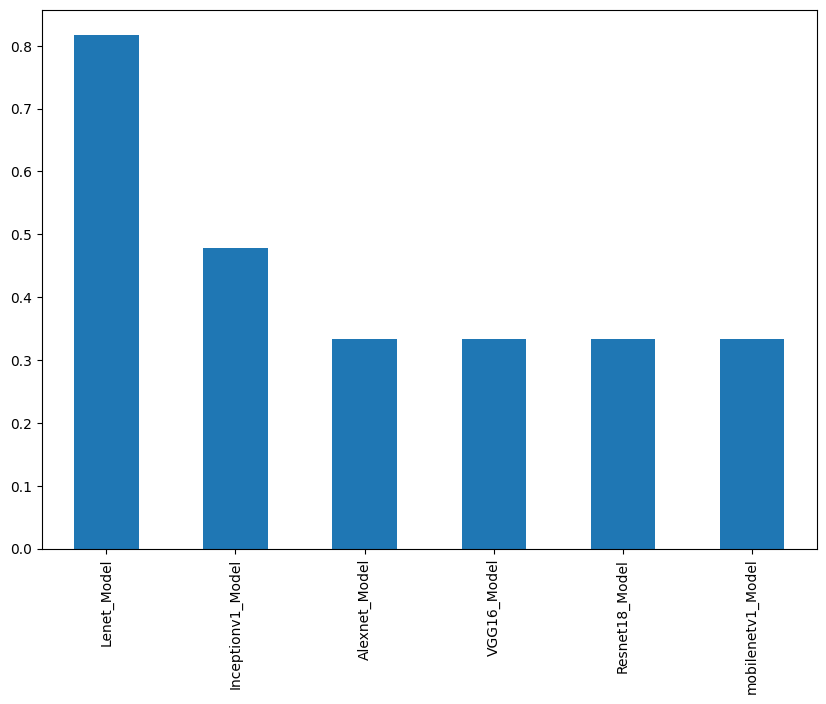

In [99]:
all_model_results.sort_values("f1", ascending=False)["f1"].plot(kind="bar", figsize=(10, 7));

# Tensorboard Callbacks

In [100]:
%load_ext tensorboard
%tensorboard --logdir /content/logs

<IPython.core.display.Javascript object>

# Model at inference

In [102]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [103]:
lenet_model.save("/content/drive/MyDrive/Beauty_Classification")

In [105]:
from tensorflow.keras.models import Model, load_model

model = load_model("/content/drive/MyDrive/Beauty_Classification")
class_names = ['average', 'beautiful']

def prediction(image_path):
    image = tf.io.decode_png(tf.io.read_file(image_path), channels=3)
    image = tf.cast(tf.image.resize(image, [128,128]), dtype=tf.float32)
    image = tf.expand_dims(image, axis=0)

    predictions = model.predict(image)
    top_prediction = np.argmax(predictions, axis=1)[0]
    confidence = predictions[0][top_prediction]
    predicted_class = class_names[top_prediction]

    print(f"Predicted Class: {predicted_class}")
    print(f"Confidence: {confidence:.2f}")

In [106]:
prediction("/content/dataset/train/average/0001.jpg")

1/1 [==============================] - 0s 482ms/step
Predicted Class: average
Confidence: 0.06


# Hugging Face

In [107]:
! pip install huggingface_hub

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 294.8/294.8 kB 2.7 MB/s eta 0:00:00


In [108]:
from huggingface_hub import notebook_login
notebook_login()

In [109]:
model = load_model("/content/drive/MyDrive/Beauty_Classification")

In [110]:
from huggingface_hub.keras_mixin import push_to_hub_keras
push_to_hub_keras(model = model, repo_id = "DriveMyScream/Facial_Beauty_Classification")

fingerprint.pb:   0%|          | 0.00/55.0 [00:00<?, ?B/s]

Upload 4 LFS files:   0%|          | 0/4 [00:00<?, ?it/s]

keras_metadata.pb:   0%|          | 0.00/19.9k [00:00<?, ?B/s]

variables.data-00000-of-00001:   0%|          | 0.00/6.97M [00:00<?, ?B/s]

saved_model.pb:   0%|          | 0.00/115k [00:00<?, ?B/s]

'https://huggingface.co/DriveMyScream/Facial_Beauty_Classification/tree/main/'

In [111]:
from huggingface_hub import from_pretrained_keras
loaded_model = from_pretrained_keras("DriveMyScream/Facial_Beauty_Classification")

config.json not found in HuggingFace Hub.


Fetching 8 files:   0%|          | 0/8 [00:00<?, ?it/s]

In [112]:
class_names = ['average', 'beautiful']

def prediction(image_path):
    image = tf.io.decode_png(tf.io.read_file(image_path), channels=3)
    image = tf.cast(tf.image.resize(image, [128,128]), dtype=tf.float32)
    image = tf.expand_dims(image, axis=0)

    predictions = model.predict(image)
    top_prediction = np.argmax(predictions, axis=1)[0]
    confidence = predictions[0][top_prediction]
    predicted_class = class_names[top_prediction]

    print(f"Predicted Class: {predicted_class}")
    print(f"Confidence: {confidence:.2f}")

In [113]:
prediction("/content/dataset/train/average/0001.jpg")

1/1 [==============================] - 0s 193ms/step
Predicted Class: average
Confidence: 0.06


# Tensorflow Lite

In [114]:
import tensorflow as tf

model = load_model("/content/drive/MyDrive/Beauty_Classification")

converter = tf.lite.TFLiteConverter.from_keras_model(model)
converter.target_spec.supported_ops = [tf.lite.OpsSet.TFLITE_BUILTINS, tf.lite.OpsSet.SELECT_TF_OPS]
converter._experimental_lower_tensor_list_ops = False
tflite_model = converter.convert()

tflite_output_path = "Beauty_Classification.tflite"
with open(tflite_output_path, "wb") as f:
    f.write(tflite_model)

In [117]:
model_path = "/content/Beauty_Classification.tflite"
interpreter = tf.lite.Interpreter(model_path=model_path)
interpreter.allocate_tensors()

input_details = interpreter.get_input_details()
output_details = interpreter.get_output_details()

class_names = ['average', 'beautiful']

image_path = "/content/dataset/train/average/0001.jpg"
image = tf.io.decode_png(tf.io.read_file(image_path), channels=3)
image = tf.cast(tf.image.resize(image, [128, 128]), dtype=tf.float32)
image = tf.expand_dims(image, axis=0)

interpreter.set_tensor(input_details[0]['index'], image)
interpreter.invoke()
output_data = interpreter.get_tensor(output_details[0]['index'])
probabilities = tf.nn.softmax(output_data)[0]
top_prediction = np.argmax(probabilities)
confidence = probabilities[top_prediction]
predicted_class = class_names[top_prediction]

print(f"Predicted Class: {predicted_class}")
print(f"Confidence: {confidence:.2f}")

Predicted Class: average
Confidence: 1.00
